In [366]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
from tabulate import tabulate
import seaborn as sns
import scikitplot as skplt
from numpy import percentile
import math
from numpy import arange
import IPython.display as ipd
import matplotlib.lines as mlines

#pandas
from pandas.plotting import parallel_coordinates
import datetime

#sklearn
from sklearn.preprocessing import PowerTransformer, QuantileTransformer
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler, RobustScaler, StandardScaler

from sklearn.decomposition import PCA
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import learning_curve

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix, roc_curve, auc
from sklearn.metrics import roc_auc_score, precision_score, recall_score, make_scorer
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline

#scikitplot
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_lift_curve
from scikitplot.metrics import plot_cumulative_gain

#tslearn
from tslearn.metrics import dtw, dtw_path, cdist_dtw, subsequence_cost_matrix

#mlxtend
from mlxtend.plotting import plot_decision_regions

#matplotlib
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
from matplotlib import pyplot

#seaborn
import seaborn as sns

#scipy
import scipy.stats as stats
from scipy.stats import shapiro, mannwhitneyu, normaltest, kstest
from scipy.stats import boxcox, yeojohnson
from scipy.spatial.distance import euclidean, cityblock, cosine, minkowski
from scipy.spatial.distance import cdist

#matrixprofile
import matrixprofile
from matrixprofile import *
from matrixprofile.discords import discords

In [367]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, silhouette_samples, davies_bouldin_score
import numpy as np
import scipy.stats as stats
import collections
import math

from kmodes.kmodes import KModes

In [368]:
def plot_general_distributions(df):
    
    for column in df.columns:

        if column != 'Labels':

            fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 5))
            cluster_list = []
            list_num_cluster = []

            for num_cluster in np.unique(df['Labels']):
                cluster_list.append(df[df['Labels'] == num_cluster][column])  #distribution
                list_num_cluster.append('Cluster %s' % num_cluster)           #num cluster

            ax[0].hist(cluster_list, label = list_num_cluster)
            ax[0].legend(title="Clusters", bbox_to_anchor = (1, 1.05), loc='upper left', \
                   frameon = True, shadow = True)
            ax[0].set_title(column + " Histogram")

            ax[1].hist(df[column], color = "#B8002E")
            ax[1].set_title(column + " Histogram (Distribution in the whole dataset)")

            fig.tight_layout()
            plt.show()

In [369]:
def analyze_single_clusters(df):
    
    for label in np.unique(df['Labels']):
        
        print("Cluster {}".format(label))
        print()
        
        Studio_0_dataset = df[(df['Labels'] == label) & (df['album_type'] == 0)] #Studio_Recording

        Live_1_dataset = df[(df['Labels'] == label) & (df['album_type'] == 1)]   #Live_Recording

        for column in df.columns:

            if (column != 'Labels' and column != 'album_type'):

                fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 5), sharey = True)

                ax[0].hist(Studio_0_dataset[column], label = 'Studio_Recording', color = "#8AB800")
                ax[0].legend(loc='upper right')
                ax[0].set_title(column + " Histogram - Cluster {}".format(label))

                ax[1].hist(Live_1_dataset[column], label = 'Live_Recording', color = "#FF3D3D")
                ax[1].legend(loc='upper right')
                ax[1].set_title(column + " Histogram - Cluster {}".format(label))

                plt.show()
        print("------------------------------------------------------------------------------------------------------------------")

In [370]:
def inertia(number_of_clusters, X, labels):
    
    manual_SSE = 0
    for i in range(number_of_clusters):
        cluster = X[labels == i]
        if len(cluster) > 0:
                clusterMean = cluster.mean(axis = 0)
                manual_SSE += ((cluster - clusterMean) ** 2).sum()
                
    return manual_SSE

In [371]:
def cluster_insight(df):
    
    cluster_diz = pd.DataFrame(columns = ["Studio_Recording", "Live_Recording"], \
                                index = ["Cluster {}".format(str(i)) for i in np.unique(df['Labels'])])
    
    tot_entropies = []
    dim_clusters = []
    max_cluster = 0

    for i in np.unique(df['Labels']):

        cluster_list = list(df[df['Labels'] == i]['album_type'])

        counter = collections.Counter(cluster_list)

        cluster_diz.loc["Cluster {}".format(str(i)), 'Studio_Recording'] = counter[0]
        cluster_diz.loc["Cluster {}".format(str(i)), 'Live_Recording'] = counter[1]

        #cluster_diz.loc["Cluster {}".format(str(i)), 'Tot_Cluster'] = cluster_diz.loc["Cluster {}".format(str(i)), ['Studio_Recording', 'Live_Recording']].sum()

        lista = cluster_diz.loc['Cluster {}'.format(str(i)), ['Studio_Recording', 'Live_Recording']].values.tolist()
        tot = sum(lista)
        cluster_diz.loc["Cluster {}".format(str(i)), 'Tot_Cluster'] = tot
        dim_clusters.append(tot)

        '''
        Entropia singola: -(sommatoria di (pij log2 pij) per tutte le classi all'interno di un cluster.
        --> pij = mij/mj dove mj è il numero di valori nel cluster j e mij è il numero di valori della classe i
        nel cluster j.
        '''
        entropy_single = sum([(x/tot)*math.log2(x/tot) for x in lista if x != 0])
        if entropy_single != 0.0:
            entropy_single*=-1
        cluster_diz.loc["Cluster {}".format(str(i)), 'Entropy'] = "%.4f" %(entropy_single)
        tot_entropies.append(entropy_single)


        '''
        Purity singola: etichetta della classe più frequente/numero di valori nel cluster
        '''
        purity_single = max(lista)/tot
        cluster_diz.loc["Cluster {}".format(str(i)), 'Purity'] = "%.4f" %(purity_single)

        max_cluster += max(lista)


    new_row = pd.Series(cluster_diz[['Studio_Recording', 'Live_Recording', 'Tot_Cluster']].sum(axis=0).astype(int), name = "Total")
    cluster_diz = cluster_diz.append(new_row, ignore_index=False)

    '''
    Entropia complessiva: sommatoria delle entropie di ogni cluster pesate per la dimensione di ogni cluster.
    --> (mj/m) * ej --> dove mj è la dimensione del cluster j e m è il numero totale di punti. 
    '''

    last_tot = cluster_diz.loc['Total', 'Tot_Cluster']
    tot_entropy = 0

    for entropy, dim in zip(tot_entropies, dim_clusters):
        tot_entropy+=(entropy*(dim/last_tot))

    cluster_diz.loc["Total", 'Entropy'] = "%.4f" %(tot_entropy)

    '''
    Purity complessiva: sommatoria delle classi "corrette" (il valore più alto) di ogni cluster, divisa per il
    numero totale di valori.
    '''

    tot_purity = max_cluster/last_tot
    cluster_diz.loc["Total", 'Purity'] = "%.4f" %(tot_purity)



    cluster_diz['Tot_Cluster'] = cluster_diz['Tot_Cluster'].astype(int)

    ipd.display(cluster_diz)

"""class KModes(BaseEstimator, ClusterMixin):

    k-modes clustering algorithm for categorical data.
    Parameters
    -----------
    n_clusters : int, optional, default: 8
        The number of clusters to form as well as the number of
        centroids to generate.
        
    max_iter : int, default: 100
        Maximum number of iterations of the k-modes algorithm for a
        single run.
        
    cat_dissim : func, default: matching_dissim
        Dissimilarity function used by the k-modes algorithm for categorical variables.
        Defaults to the matching dissimilarity function.
        
    init : {'Huang', 'Cao', 'random' or an ndarray}, default: 'Cao'
        Method for initialization:
        'Huang': Method in Huang [1997, 1998]
        'Cao': Method in Cao et al. [2009]
        'random': choose 'n_clusters' observations (rows) at random from
        data for the initial centroids.
        If an ndarray is passed, it should be of shape (n_clusters, n_features)
        and gives the initial centroids.
        
    n_init : int, default: 10
        Number of time the k-modes algorithm will be run with different
        centroid seeds. The final results will be the best output of
        n_init consecutive runs in terms of cost.
        
    verbose : int, optional
        Verbosity mode.
        
    random_state : int, RandomState instance or None, optional, default: None
        If int, random_state is the seed used by the random number generator;
        If RandomState instance, random_state is the random number generator;
        If None, the random number generator is the RandomState instance used
        by `np.random`.
        
    n_jobs : int, default: 1
        The number of jobs to use for the computation. This works by computing
        each of the n_init runs in parallel.
        If -1 all CPUs are used. If 1 is given, no parallel computing code is
        used at all, which is useful for debugging. For n_jobs below -1,
        (n_cpus + 1 + n_jobs) are used. Thus for n_jobs = -2, all CPUs but one
        are used.
        
    Attributes
    ----------
    cluster_centroids_ : array, [n_clusters, n_features]
        Categories of cluster centroids
        
    labels_ :
        Labels of each point
        
    cost_ : float
        Clustering cost, defined as the sum distance of all points to
        their respective cluster centroids.
        
    n_iter_ : int
        The number of iterations the algorithm ran for.
        
    epoch_costs_ :
        The cost of the algorithm at each epoch from start to completion.
        
    Notes
    -----
    See:
    Huang, Z.: Extensions to the k-modes algorithm for clustering large
    data sets with categorical values, Data Mining and Knowledge
    Discovery 2(3), 1998.
    """

In [372]:
def run_kmodes(X):
    
    max_k = 20
    sse_list = list()
    silhouette = list()
    calinski = list()
    bouldin = list()
    fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (18, 10))

    for k in range(2, max_k+1):
        
        #-----------------------------------run algorithm------------------------------------#
        
        km = KModes(n_clusters = k, init = 'Huang', verbose = 0, random_state = 0)
        clusters = km.fit_predict(X)

        #-----------------------------------calculate metrics--------------------------------#
        
        n_clusters = len(np.unique(km.labels_))
        
        sse = inertia(n_clusters, X, km.labels_)
        sse_list.append(sse)
        
        sil = silhouette_score(X, km.labels_)
        silhouette.append(sil)
        
        cal = calinski_harabasz_score(X, km.labels_)
        calinski.append(cal)
        
        boul = davies_bouldin_score(X, km.labels_)
        bouldin.append(boul)
        
        print("k: ", k)
        print ('SSE: ', sse)
        print('Cost:', km.cost_)
        print ('Silhouette Score: ', sil)
        print ("Calinski - Harabaz Score: ", cal)
        print ("Davies - Bouldin Score: ", boul)
        print()
        print("---------------------------------")
        print()
        
        
    
    index = [i for i in range(2, max_k + 1)]
    
    ax[0, 0].plot(range(2, len(sse_list) + 2), sse_list)
    ax[0, 0].set_ylabel('SSE', fontsize=15)
    ax[0, 0].set_xlabel('K', fontsize=15)

    ax[0, 1].plot(range(2, len(silhouette) + 2), silhouette)
    ax[0, 1].set_ylabel('SIL', fontsize=15)
    ax[0, 1].set_xlabel('K', fontsize=15)

    ax[1, 0].plot(range(2, len(calinski) + 2), calinski)
    ax[1, 0].set_ylabel('CAL', fontsize=15)
    ax[1, 0].set_xlabel('K', fontsize=15)

    ax[1, 1].plot(range(2, len(bouldin) + 2), bouldin)
    ax[1, 1].set_ylabel('BOUL', fontsize=15)
    ax[1, 1].set_xlabel('K', fontsize=15)
    
    for axis in ax.flat:
        axis.xaxis.set_major_locator(MultipleLocator(5))
        axis.xaxis.set_minor_locator(MultipleLocator(1))
        axis.tick_params(which='major', length=9)
        axis.tick_params(which='minor', length=7, color='r')

    plt.show()
    fig.tight_layout()

In [373]:
def concatenate(df_generale, df):
    
    #new_row = pd.Series(dtype='object', name = '----------')
    #df_generale = df_generale.append(new_row, ignore_index=False)
    #df_generale = df_generale.replace(np.nan, '----------', regex = True)
    
    df_generale = pd.concat([df_generale, df])
    #ipd.display(df_generale)
    
    return df_generale

In [374]:
dissimilarity_function = 'matching_dissim'

In [375]:
init_alg = 'Huang'

In [376]:
df_complete = pd.read_csv('group_20_fma_numeric.csv', index_col = 0)

In [377]:
df_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 56 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   chroma_cens_02                       103708 non-null  float64
 1   chroma_cens_04                       103708 non-null  float64
 2   chroma_cens_06                       103708 non-null  float64
 3   chroma_cens_07                       103708 non-null  float64
 4   chroma_cens_09                       103708 non-null  float64
 5   chroma_cens_11                       103708 non-null  float64
 6   chroma_stft_05                       103708 non-null  float64
 7   chroma_stft_08                       103708 non-null  float64
 8   chroma_stft_10                       103708 non-null  float64
 9   chroma_stft_12                       103708 non-null  float64
 10  mfcc_02                              103708 non-null  float64
 11  mfcc_03      

In [378]:
numeric_columns = []  # continous variables
for column_name in df_complete.columns:
    if ("track_genre_top" not in column_name) and  \
          ("track_date_created_year" not in column_name) and \
            ("track_date_created_season" not in column_name):
                numeric_columns.append(column_name)
print("numeric_columns", len(numeric_columns))

numeric_columns 38


In [379]:
categoric_columns = []  # ordinal or categorical variables
for column_name in df_complete.columns:
    if ("track_genre_top" in column_name) or  \
          ("track_date_created_year" in column_name) or \
            ("track_date_created_season" in column_name):
                categoric_columns.append(column_name)
print("categoric_columns", len(categoric_columns))

categoric_columns 18


In [380]:
album_type = df_complete['album_type']

In [381]:
df_complete = df_complete[categoric_columns]

In [382]:
df_complete['album_type'] = album_type

In [383]:
df_complete

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,track_genre_top_Blues,track_genre_top_Classical,track_genre_top_Country,track_genre_top_Old-Time_/_Historic,track_genre_top_Easy_Listening,track_genre_top_Instrumental,track_date_created_year,track_date_created_season,album_type
track_id,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
20,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10,1,1
155317,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10,1,1
155318,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10,1,1


In [384]:
df_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 19 columns):
 #   Column                               Non-Null Count   Dtype
---  ------                               --------------   -----
 0   track_genre_top_Hip-Hop              103708 non-null  int64
 1   track_genre_top_Pop                  103708 non-null  int64
 2   track_genre_top_Experimental         103708 non-null  int64
 3   track_genre_top_Folk                 103708 non-null  int64
 4   track_genre_top_Jazz                 103708 non-null  int64
 5   track_genre_top_Rock                 103708 non-null  int64
 6   track_genre_top_Electronic           103708 non-null  int64
 7   track_genre_top_Spoken               103708 non-null  int64
 8   track_genre_top_International        103708 non-null  int64
 9   track_genre_top_Soul-RnB             103708 non-null  int64
 10  track_genre_top_Blues                103708 non-null  int64
 11  track_genre_top_Classical            10

<h2>New Dataset - Onehot encoding for ordinal features</h2>

In [385]:
df_tot = df_complete

In [386]:
df_tot

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,track_genre_top_Blues,track_genre_top_Classical,track_genre_top_Country,track_genre_top_Old-Time_/_Historic,track_genre_top_Easy_Listening,track_genre_top_Instrumental,track_date_created_year,track_date_created_season,album_type
track_id,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
20,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10,1,1
155317,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10,1,1
155318,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,10,1,1


In [387]:
df_tot = pd.get_dummies(df_tot, columns = ['track_date_created_year', 'track_date_created_season'], dtype = int)

In [388]:
df_tot

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,...,track_date_created_year_5,track_date_created_year_6,track_date_created_year_7,track_date_created_year_8,track_date_created_year_9,track_date_created_year_10,track_date_created_season_1,track_date_created_season_2,track_date_created_season_3,track_date_created_season_4
track_id,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
20,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
155317,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
155318,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0


In [389]:
df_tot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 31 columns):
 #   Column                               Non-Null Count   Dtype
---  ------                               --------------   -----
 0   track_genre_top_Hip-Hop              103708 non-null  int64
 1   track_genre_top_Pop                  103708 non-null  int64
 2   track_genre_top_Experimental         103708 non-null  int64
 3   track_genre_top_Folk                 103708 non-null  int64
 4   track_genre_top_Jazz                 103708 non-null  int64
 5   track_genre_top_Rock                 103708 non-null  int64
 6   track_genre_top_Electronic           103708 non-null  int64
 7   track_genre_top_Spoken               103708 non-null  int64
 8   track_genre_top_International        103708 non-null  int64
 9   track_genre_top_Soul-RnB             103708 non-null  int64
 10  track_genre_top_Blues                103708 non-null  int64
 11  track_genre_top_Classical            10

In [390]:
df_tot.to_csv("df_categorical_AllOnehot.csv")

-------------------------------------------------------------------------------------------------------------------

<h2>All categorical features</h2>

In [391]:
df_all_features = df_tot[[col for col in df_tot.columns if col != 'album_type']]

In [392]:
df_all_features

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,...,track_date_created_year_5,track_date_created_year_6,track_date_created_year_7,track_date_created_year_8,track_date_created_year_9,track_date_created_year_10,track_date_created_season_1,track_date_created_season_2,track_date_created_season_3,track_date_created_season_4
track_id,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
20,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
155317,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
155318,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0


In [393]:
df_all_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 30 columns):
 #   Column                               Non-Null Count   Dtype
---  ------                               --------------   -----
 0   track_genre_top_Hip-Hop              103708 non-null  int64
 1   track_genre_top_Pop                  103708 non-null  int64
 2   track_genre_top_Experimental         103708 non-null  int64
 3   track_genre_top_Folk                 103708 non-null  int64
 4   track_genre_top_Jazz                 103708 non-null  int64
 5   track_genre_top_Rock                 103708 non-null  int64
 6   track_genre_top_Electronic           103708 non-null  int64
 7   track_genre_top_Spoken               103708 non-null  int64
 8   track_genre_top_International        103708 non-null  int64
 9   track_genre_top_Soul-RnB             103708 non-null  int64
 10  track_genre_top_Blues                103708 non-null  int64
 11  track_genre_top_Classical            10

In [394]:
df_all_features = df_all_features.values

k:  2
SSE:  248474.81237143028
Cost: 300128.0
Silhouette Score:  0.030562667022813746
Calinski - Harabaz Score:  3632.0448803045883
Davies - Bouldin Score:  1.9453822869486053

---------------------------------

k:  3
SSE:  202082.2090177422
Cost: 251796.0
Silhouette Score:  0.16671054368454782
Calinski - Harabaz Score:  14136.840463373483
Davies - Bouldin Score:  2.2792535180730096

---------------------------------

k:  4
SSE:  179128.70404303347
Cost: 207416.0
Silhouette Score:  0.21331791290834481
Calinski - Harabaz Score:  15061.652880743788
Davies - Bouldin Score:  1.849831194204955

---------------------------------

k:  5
SSE:  195745.85352956902
Cost: 245304.0
Silhouette Score:  0.13002259280891612
Calinski - Harabaz Score:  8136.311277387308
Davies - Bouldin Score:  2.4970759969957435

---------------------------------

k:  6
SSE:  174908.0894422155
Cost: 203346.0
Silhouette Score:  0.12660075946395727
Calinski - Harabaz Score:  9755.35572965193
Davies - Bouldin Score:  1.975

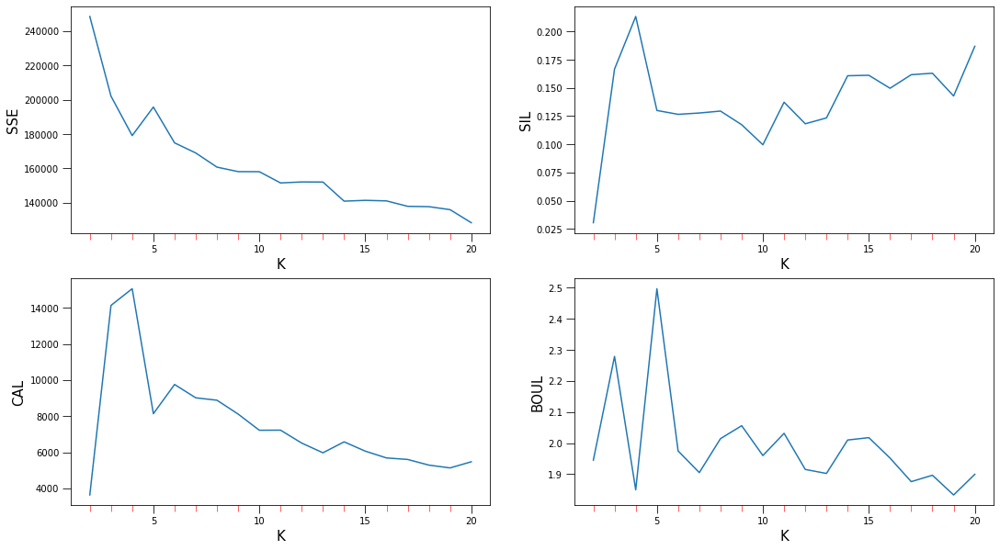

In [395]:
run_kmodes(df_all_features)

In [396]:
km = KModes(n_clusters = 4, init = 'Huang', verbose = 0, random_state = 0)
clusters = km.fit_predict(df_all_features)

n_clusters = len(np.unique(km.labels_))
        
sse = inertia(n_clusters, df_all_features, km.labels_)
       
sil = silhouette_score(df_all_features, km.labels_)
        
cal = calinski_harabasz_score(df_all_features, km.labels_)
       
boul = davies_bouldin_score(df_all_features, km.labels_)
 
print ('SSE: ', sse)
print('Cost:', km.cost_)
print ('Silhouette Score: ', sil)
print ("Calinski - Harabaz Score: ", cal)
print ("Davies - Bouldin Score: ", boul)

df_metrics_1 = pd.DataFrame({'Init': init_alg, \
                             'Dissimilarity_function': dissimilarity_function, \
                             'N_clusters': len(np.unique(km.labels_)), 'SSE': '%.4f'%(sse), \
                             'Silhouette': '%.4f'%(sil), 'Calinski': '%.4f'%(cal), \
                             'Bouldin': '%.4f'%(boul)}, index = ['Genres, years and seasons'])

SSE:  179128.70404303347
Cost: 207416.0
Silhouette Score:  0.21331791290834481
Calinski - Harabaz Score:  15061.652880743788
Davies - Bouldin Score:  1.849831194204955


In [397]:
df_generale = df_metrics_1.copy()

In [398]:
df_all_features_complete = df_tot.copy()

In [399]:
df_all_features_complete['Labels'] = km.labels_

In [400]:
cluster_insight(df_all_features_complete)

,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,19518,2672,22190,0.5306,0.8796
Cluster 1,25546,4178,29724,0.5857,0.8594
Cluster 2,21537,1970,23507,0.4154,0.9162
Cluster 3,25582,2705,28287,0.4550,0.9044
Total,92183,11525,103708,0.4997,0.8889


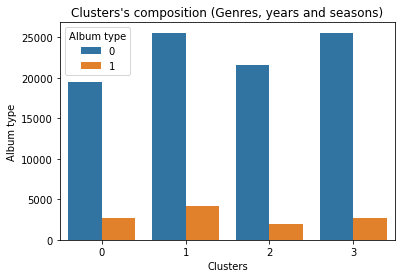

In [401]:
b = sns.countplot(x=df_all_features_complete['Labels'], data=df_all_features_complete, \
                  hue = df_all_features_complete['album_type'])
b.set_xlabel("Clusters")
b.set_ylabel("Album type")
b.set_title("Clusters's composition (Genres, years and seasons)")
b.tick_params()
b.legend_.set_title('Album type')
b.grid(False)

<h2>Feature selection (Genres and years) </h2>

In [402]:
df_tot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 31 columns):
 #   Column                               Non-Null Count   Dtype
---  ------                               --------------   -----
 0   track_genre_top_Hip-Hop              103708 non-null  int64
 1   track_genre_top_Pop                  103708 non-null  int64
 2   track_genre_top_Experimental         103708 non-null  int64
 3   track_genre_top_Folk                 103708 non-null  int64
 4   track_genre_top_Jazz                 103708 non-null  int64
 5   track_genre_top_Rock                 103708 non-null  int64
 6   track_genre_top_Electronic           103708 non-null  int64
 7   track_genre_top_Spoken               103708 non-null  int64
 8   track_genre_top_International        103708 non-null  int64
 9   track_genre_top_Soul-RnB             103708 non-null  int64
 10  track_genre_top_Blues                103708 non-null  int64
 11  track_genre_top_Classical            10

In [403]:
df_genres_years_complete = df_tot[[col for col in df_tot.columns if 'genre_top' in col or \
                            'track_date_created_year' in col or \
                            'album_type' in col]]

In [404]:
df_genres_years_complete

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,...,track_date_created_year_1,track_date_created_year_2,track_date_created_year_3,track_date_created_year_4,track_date_created_year_5,track_date_created_year_6,track_date_created_year_7,track_date_created_year_8,track_date_created_year_9,track_date_created_year_10
track_id,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
20,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
155317,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
155318,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [405]:
df_genres_years_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 27 columns):
 #   Column                               Non-Null Count   Dtype
---  ------                               --------------   -----
 0   track_genre_top_Hip-Hop              103708 non-null  int64
 1   track_genre_top_Pop                  103708 non-null  int64
 2   track_genre_top_Experimental         103708 non-null  int64
 3   track_genre_top_Folk                 103708 non-null  int64
 4   track_genre_top_Jazz                 103708 non-null  int64
 5   track_genre_top_Rock                 103708 non-null  int64
 6   track_genre_top_Electronic           103708 non-null  int64
 7   track_genre_top_Spoken               103708 non-null  int64
 8   track_genre_top_International        103708 non-null  int64
 9   track_genre_top_Soul-RnB             103708 non-null  int64
 10  track_genre_top_Blues                103708 non-null  int64
 11  track_genre_top_Classical            10

In [406]:
df_genres_years = df_genres_years_complete[[col for col in df_genres_years_complete.columns \
                                            if 'album_type' not in col]]

In [407]:
df_genres_years

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,...,track_date_created_year_1,track_date_created_year_2,track_date_created_year_3,track_date_created_year_4,track_date_created_year_5,track_date_created_year_6,track_date_created_year_7,track_date_created_year_8,track_date_created_year_9,track_date_created_year_10
track_id,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
20,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
155317,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
155318,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [408]:
df_genres_years = df_genres_years.values

k:  2
SSE:  158003.50519225956
Cost: 183229.0
Silhouette Score:  0.12856047778489316
Calinski - Harabaz Score:  14292.975804759619
Davies - Bouldin Score:  2.0772663723051763

---------------------------------

k:  3
SSE:  149851.1418491897
Cost: 175591.0
Silhouette Score:  0.13450216286704966
Calinski - Harabaz Score:  10356.141777105691
Davies - Bouldin Score:  2.058920030454217

---------------------------------

k:  4
SSE:  138746.27518213657
Cost: 164213.0
Silhouette Score:  0.16362704390941776
Calinski - Harabaz Score:  10223.333922353107
Davies - Bouldin Score:  2.03513243922891

---------------------------------

k:  5
SSE:  128175.00555649774
Cost: 149641.0
Silhouette Score:  0.1576984733806368
Calinski - Harabaz Score:  10438.033183929265
Davies - Bouldin Score:  1.8162556754115002

---------------------------------

k:  6
SSE:  126702.1173785376
Cost: 153937.0
Silhouette Score:  0.20120227915407352
Calinski - Harabaz Score:  8688.520451338958
Davies - Bouldin Score:  1.97817

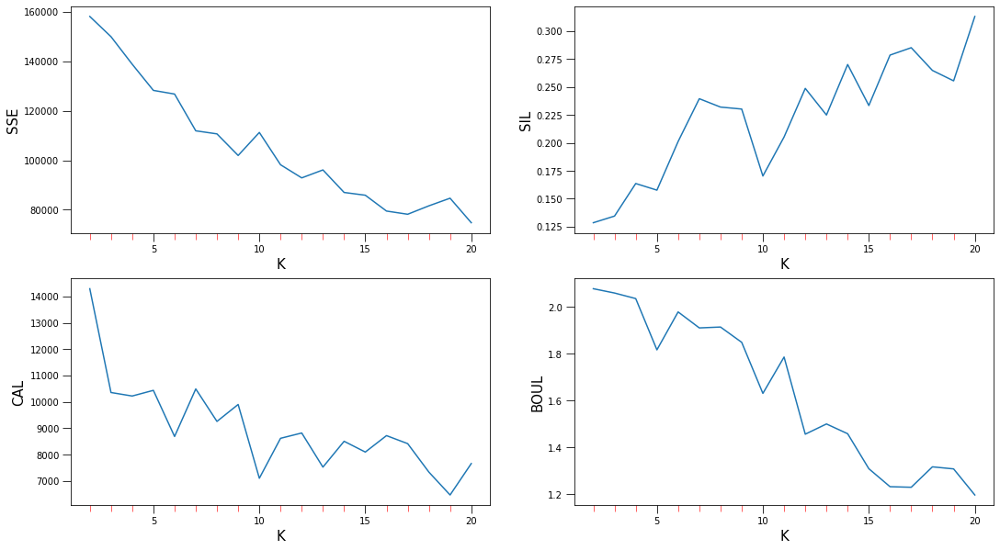

In [409]:
run_kmodes(df_genres_years)

In [410]:
km = KModes(n_clusters = 7, init = 'Huang', verbose = 0, random_state = 0)
clusters = km.fit_predict(df_genres_years)

n_clusters = len(np.unique(km.labels_))
        
sse = inertia(n_clusters, df_genres_years, km.labels_)
       
sil = silhouette_score(df_genres_years, km.labels_)
        
cal = calinski_harabasz_score(df_genres_years, km.labels_)
       
boul = davies_bouldin_score(df_genres_years, km.labels_)
 
print ('SSE: ', sse)
print('Cost:', km.cost_)
print ('Silhouette Score: ', sil)
print ("Calinski - Harabaz Score: ", cal)
print ("Davies - Bouldin Score: ", boul)

df_metrics_2 = pd.DataFrame({'Init': init_alg, \
                             'Dissimilarity_function': dissimilarity_function, \
                             'N_clusters': len(np.unique(km.labels_)), 'SSE': '%.4f'%(sse), \
                             'Silhouette': '%.4f'%(sil), 'Calinski': '%.4f'%(cal), \
                             'Bouldin': '%.4f'%(boul)}, index = ['Genres and years'])

SSE:  111868.865600385
Cost: 135069.0
Silhouette Score:  0.2394911655924569
Calinski - Harabaz Score:  10492.105522313961
Davies - Bouldin Score:  1.909906105880189


In [411]:
df_generale = concatenate(df_generale, df_metrics_2)

In [412]:
df_genres_years_complete_labels = df_genres_years_complete.copy()

In [413]:
df_genres_years_complete_labels['Labels'] = km.labels_

In [414]:
cluster_insight(df_genres_years_complete_labels)

,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,28076,3285,31361,0.4839,0.8953
Cluster 1,7710,174,7884,0.1529,0.9779
Cluster 2,11046,565,11611,0.2807,0.9513
Cluster 3,15972,5833,21805,0.8379,0.7325
Cluster 4,7435,621,8056,0.3918,0.9229
Cluster 5,17280,1016,18296,0.3094,0.9445
Cluster 6,4664,31,4695,0.0573,0.9934
Total,92183,11525,103708,0.4532,0.8889


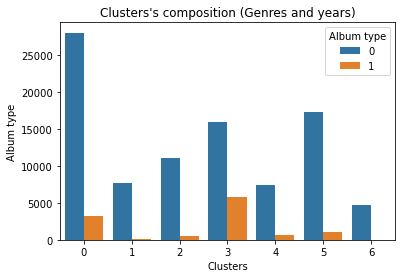

In [415]:
b = sns.countplot(x=df_genres_years_complete_labels['Labels'], data=df_genres_years_complete_labels, \
                  hue = df_genres_years_complete_labels['album_type'])
b.set_xlabel("Clusters")
b.set_ylabel("Album type")
b.set_title("Clusters's composition (Genres and years)")
b.tick_params()
b.legend_.set_title('Album type')
b.grid(False)

<h2>Feature selection (Genres and seasons)</h2>

In [416]:
df_tot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 31 columns):
 #   Column                               Non-Null Count   Dtype
---  ------                               --------------   -----
 0   track_genre_top_Hip-Hop              103708 non-null  int64
 1   track_genre_top_Pop                  103708 non-null  int64
 2   track_genre_top_Experimental         103708 non-null  int64
 3   track_genre_top_Folk                 103708 non-null  int64
 4   track_genre_top_Jazz                 103708 non-null  int64
 5   track_genre_top_Rock                 103708 non-null  int64
 6   track_genre_top_Electronic           103708 non-null  int64
 7   track_genre_top_Spoken               103708 non-null  int64
 8   track_genre_top_International        103708 non-null  int64
 9   track_genre_top_Soul-RnB             103708 non-null  int64
 10  track_genre_top_Blues                103708 non-null  int64
 11  track_genre_top_Classical            10

In [417]:
df_genres_seasons_complete = df_tot[[col for col in df_tot.columns if 'genre_top' in col or \
                            'track_date_created_season' in col or \
                            'album_type' in col]]

In [418]:
df_genres_seasons_complete

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,...,track_genre_top_Classical,track_genre_top_Country,track_genre_top_Old-Time_/_Historic,track_genre_top_Easy_Listening,track_genre_top_Instrumental,album_type,track_date_created_season_1,track_date_created_season_2,track_date_created_season_3,track_date_created_season_4
track_id,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
20,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
155317,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
155318,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0


In [419]:
df_genres_seasons = df_genres_seasons_complete[[col for col in df_genres_seasons_complete.columns if \
                                                'album_type' not in col]]

In [420]:
df_genres_seasons

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,track_genre_top_Blues,track_genre_top_Classical,track_genre_top_Country,track_genre_top_Old-Time_/_Historic,track_genre_top_Easy_Listening,track_genre_top_Instrumental,track_date_created_season_1,track_date_created_season_2,track_date_created_season_3,track_date_created_season_4
track_id,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
10,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
20,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
155317,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
155318,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [421]:
df_genres_seasons = df_genres_seasons.values

k:  2
SSE:  143472.77826155268
Cost: 183229.0
Silhouette Score:  0.15622401133819488
Calinski - Harabaz Score:  15679.56786853361
Davies - Bouldin Score:  1.9572533889758055

---------------------------------

k:  3
SSE:  128318.12533501827
Cost: 171096.0
Silhouette Score:  0.19992849668312962
Calinski - Harabaz Score:  14889.489477043637
Davies - Bouldin Score:  1.8485340059565818

---------------------------------

k:  4
SSE:  105981.8497064478
Cost: 137920.0
Silhouette Score:  0.25390805048263515
Calinski - Harabaz Score:  19303.64193461983
Davies - Bouldin Score:  1.6154121648449355

---------------------------------

k:  5
SSE:  111388.31753886759
Cost: 151606.0
Silhouette Score:  0.25150041326005157
Calinski - Harabaz Score:  12516.530102898912
Davies - Bouldin Score:  1.7957989286717386

---------------------------------

k:  6
SSE:  84206.45388490925
Cost: 100520.0
Silhouette Score:  0.28400947920319836
Calinski - Harabaz Score:  19940.37363928643
Davies - Bouldin Score:  1.138

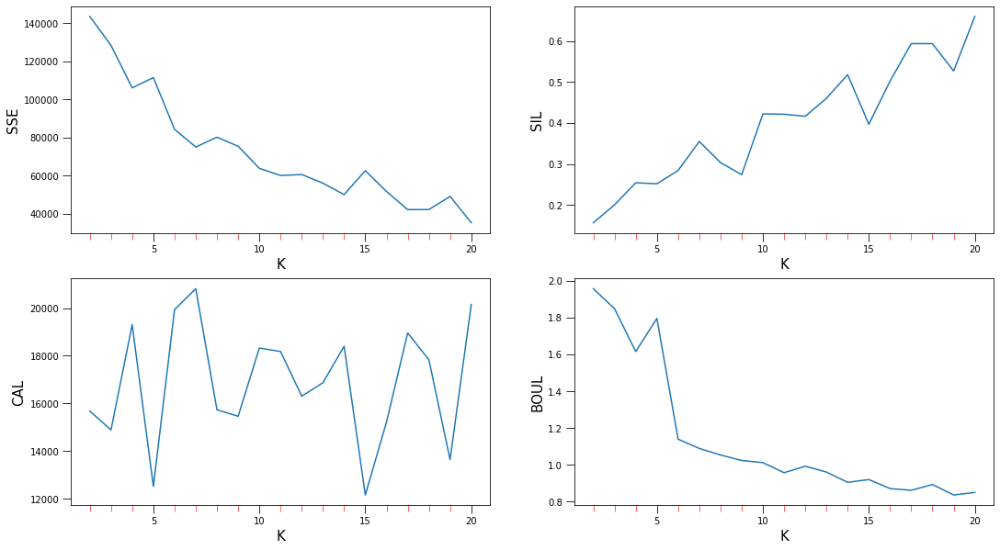

In [422]:
run_kmodes(df_genres_seasons)

In [423]:
km = KModes(n_clusters = 7, init = 'Huang', verbose = 0, random_state = 0)
clusters = km.fit_predict(df_genres_seasons)

n_clusters = len(np.unique(km.labels_))
        
sse = inertia(n_clusters, df_genres_seasons, km.labels_)
       
sil = silhouette_score(df_genres_seasons, km.labels_)
        
cal = calinski_harabasz_score(df_genres_seasons, km.labels_)
       
boul = davies_bouldin_score(df_genres_seasons, km.labels_)
 
print ('SSE: ', sse)
print('Cost:', km.cost_)
print ('Silhouette Score: ', sil)
print ("Calinski - Harabaz Score: ", cal)
print ("Davies - Bouldin Score: ", boul)

df_metrics_3 = pd.DataFrame({'Init': init_alg, \
                             'Dissimilarity_function': dissimilarity_function, \
                             'N_clusters': len(np.unique(km.labels_)), 'SSE': '%.4f'%(sse), \
                             'Silhouette': '%.4f'%(sil), 'Calinski': '%.4f'%(cal), \
                             'Bouldin': '%.4f'%(boul)}, index = ['Genres and seasons'])

SSE:  74930.22893483742
Cost: 89669.0
Silhouette Score:  0.354857496594042
Calinski - Harabaz Score:  20813.614978357386
Davies - Bouldin Score:  1.0886375635755599


In [424]:
df_generale = concatenate(df_generale, df_metrics_3)

In [425]:
df_genres_seasons_complete_labels = df_genres_seasons_complete.copy()

In [426]:
df_genres_seasons_complete_labels['Labels'] = km.labels_

In [427]:
cluster_insight(df_genres_seasons_complete_labels)

,Studio_Recording,Live_Recording,Tot_Cluster,Entropy,Purity
Cluster 0,25582,2705,28287,0.4550,0.9044
Cluster 1,21537,1970,23507,0.4154,0.9162
Cluster 2,1294,271,1565,0.6649,0.8268
Cluster 3,4905,2082,6987,0.8788,0.7020
Cluster 4,15482,1221,16703,0.3774,0.9269
Cluster 5,19347,1825,21172,0.4237,0.9138
Cluster 6,4036,1451,5487,0.8334,0.7356
Total,92183,11525,103708,0.4789,0.8889


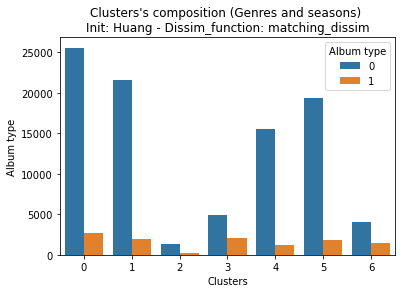

In [446]:
b = sns.countplot(x=df_genres_seasons_complete_labels['Labels'], data=df_genres_seasons_complete_labels, \
                  hue = df_genres_seasons_complete_labels['album_type'])
b.set_xlabel("Clusters")
b.set_ylabel("Album type")
b.set_title("Clusters's composition (Genres and seasons) \nInit: {} - Dissim_function: {}".format(init_alg, dissimilarity_function))
b.tick_params()
b.legend_.set_title('Album type')
b.grid(False)

In [429]:
df_prova = df_genres_seasons_complete_labels[df_genres_seasons_complete_labels['album_type'] == 1]

In [430]:
sns.color_palette()[1]

(1.0, 0.4980392156862745, 0.054901960784313725)

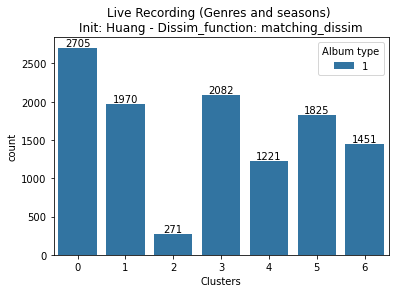

In [447]:
g = sns.countplot(x=df_prova['Labels'], data=df_prova, \
                  hue = df_prova['album_type'])
g.set_xlabel("Clusters")
g.set_title("Live Recording (Genres and seasons) \nInit: {} - Dissim_function: {}".format(init_alg, dissimilarity_function))
g.tick_params()
g.legend_.set_title('Album type')
g.grid(False)

for p in g.patches:
        g.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center', \
                   xytext = (0, 5), \
                   textcoords = 'offset points')

In [432]:
ipd.display(df_generale)

,Init,Dissimilarity_function,N_clusters,SSE,Silhouette,Calinski,Bouldin
"Genres, years and seasons",Huang,matching_dissim,4,179128.7040,0.2133,15061.6529,1.8498
Genres and years,Huang,matching_dissim,7,111868.8656,0.2395,10492.1055,1.9099
Genres and seasons,Huang,matching_dissim,7,74930.2289,0.3549,20813.6150,1.0886


**We can see that the best clustering is that composed by Genres and Seasons, that has the best Silhouette value and the lower SSE value, so we analize these clusters.**

In [433]:
df_genres_seasons_complete_labels

,track_genre_top_Hip-Hop,track_genre_top_Pop,track_genre_top_Experimental,track_genre_top_Folk,track_genre_top_Jazz,track_genre_top_Rock,track_genre_top_Electronic,track_genre_top_Spoken,track_genre_top_International,track_genre_top_Soul-RnB,...,track_genre_top_Country,track_genre_top_Old-Time_/_Historic,track_genre_top_Easy_Listening,track_genre_top_Instrumental,album_type,track_date_created_season_1,track_date_created_season_2,track_date_created_season_3,track_date_created_season_4,Labels
track_id,,,,,,,,,,,,,,,,,,,,,
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
20,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
155317,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
155318,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0


/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


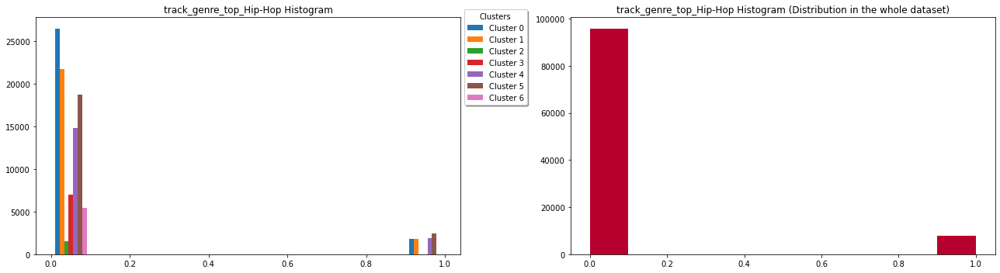

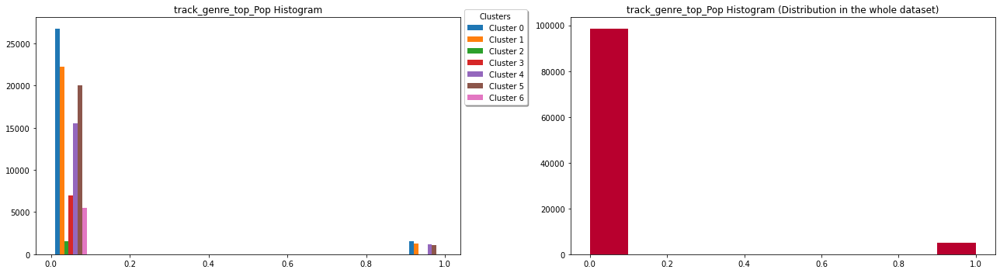

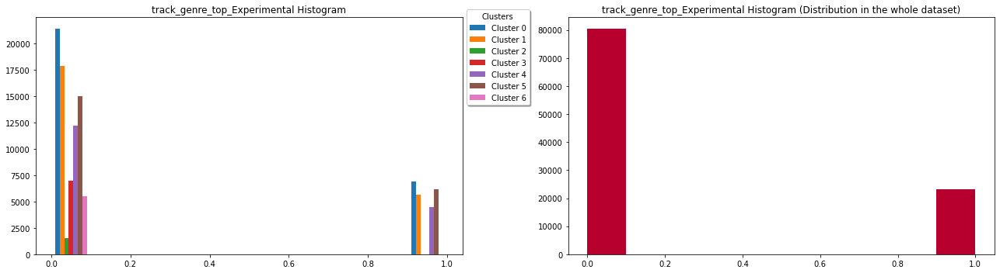

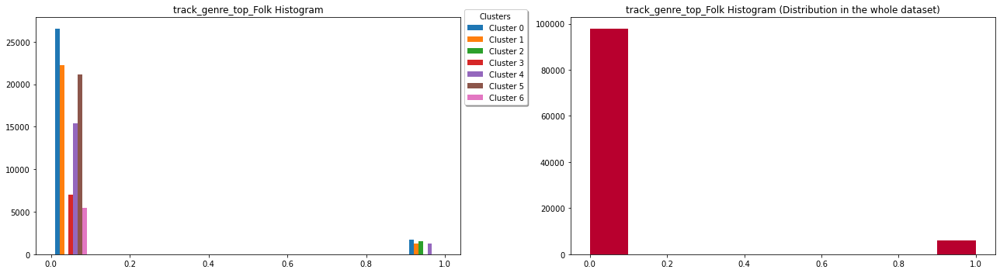

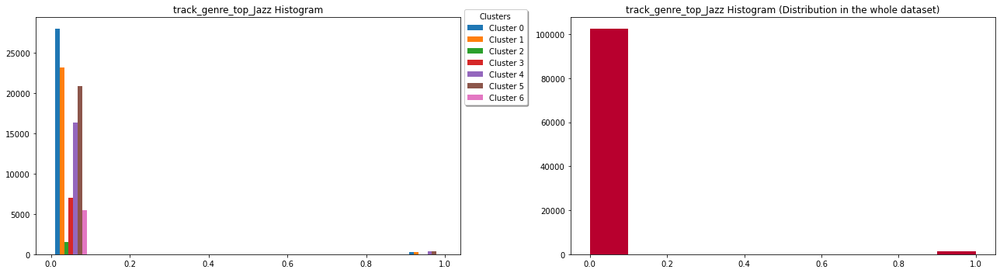

...

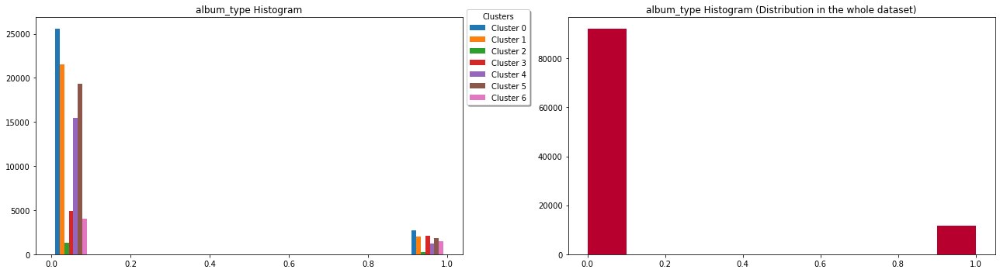

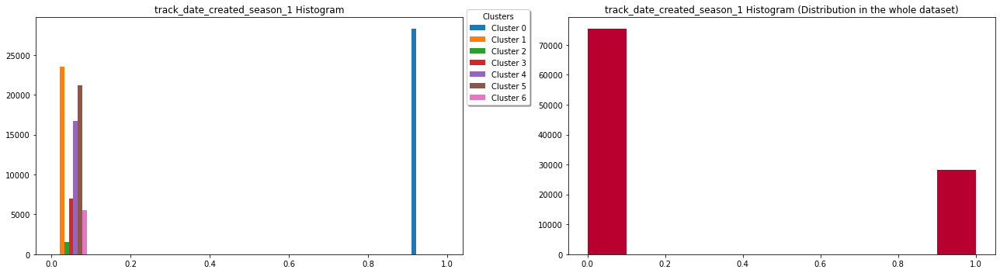

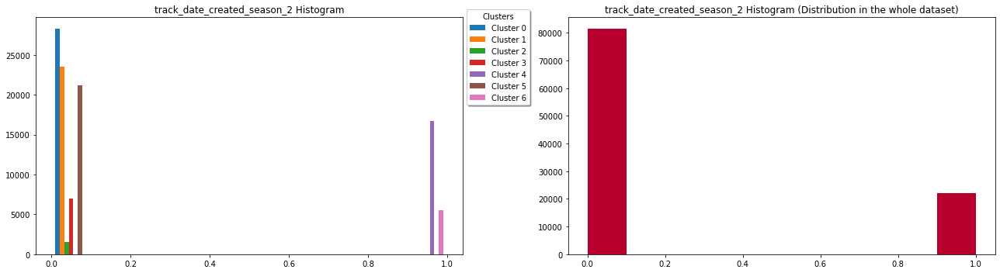

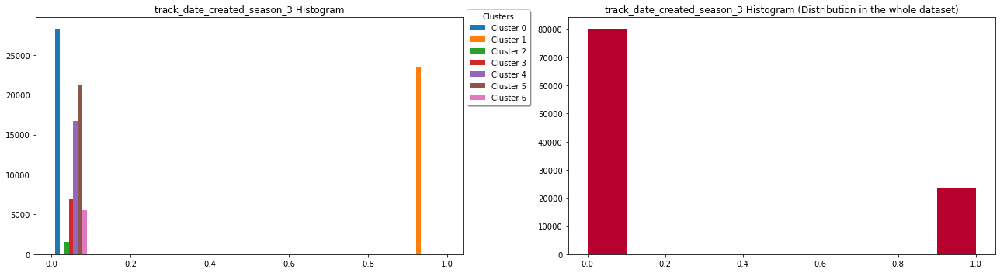

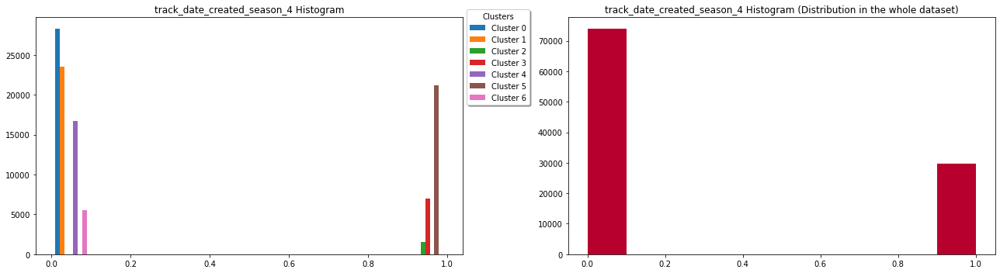

In [434]:
plot_general_distributions(df_genres_seasons_complete_labels)

**We create a copy of the original dataset but with ordinal features (years and seasons) encoded with onehot encoding.**

In [435]:
df_original_onehot = pd.read_csv('group_20_fma_numeric.csv', index_col = 0)

In [436]:
df_original_onehot = pd.get_dummies(df_original_onehot, \
                            columns = ['track_date_created_year', 'track_date_created_season'], dtype = int)

In [437]:
df_original_onehot

,chroma_cens_02,chroma_cens_04,chroma_cens_06,chroma_cens_07,chroma_cens_09,chroma_cens_11,chroma_stft_05,chroma_stft_08,chroma_stft_10,chroma_stft_12,...,track_date_created_year_5,track_date_created_year_6,track_date_created_year_7,track_date_created_year_8,track_date_created_year_9,track_date_created_year_10,track_date_created_season_1,track_date_created_season_2,track_date_created_season_3,track_date_created_season_4
track_id,,,,,,,,,,,,,,,,,,,,,
2,0.534301,0.311606,0.336365,0.341694,0.292243,0.276052,0.341598,0.430064,0.381936,0.529627,...,0,0,0,0,0,0,0,0,1,0
3,0.331490,0.296091,0.368770,0.550413,0.464814,0.363497,0.391794,0.581584,0.510926,0.540496,...,0,0,0,0,0,0,0,0,1,0
5,0.438305,0.298619,0.358552,0.411062,0.515737,0.338845,0.335509,0.353870,0.418968,0.467409,...,0,0,0,0,0,0,0,0,1,0
10,0.414595,0.309863,0.438154,0.616182,0.399730,0.369890,0.357122,0.420764,0.370725,0.388618,...,0,0,0,0,0,0,0,0,1,0
20,0.354114,0.256808,0.361826,0.415287,0.368049,0.419011,0.390003,0.575782,0.556986,0.491322,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155316,0.239374,0.506758,0.610919,0.257752,0.253840,0.242582,0.512779,0.418091,0.422479,0.476460,...,0,0,0,0,0,1,1,0,0,0
155317,0.376784,0.453340,0.290186,0.281965,0.324159,0.404858,0.579709,0.609059,0.567302,0.643192,...,0,0,0,0,0,1,1,0,0,0
155318,0.297417,0.480687,0.499205,0.311303,0.363107,0.317513,0.582218,0.529418,0.496228,0.579227,...,0,0,0,0,0,1,1,0,0,0


In [438]:
df_original_onehot['Labels'] = df_genres_seasons_complete_labels['Labels']

In [439]:
df_original_onehot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103708 entries, 2 to 155320
Data columns (total 69 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   chroma_cens_02                       103708 non-null  float64
 1   chroma_cens_04                       103708 non-null  float64
 2   chroma_cens_06                       103708 non-null  float64
 3   chroma_cens_07                       103708 non-null  float64
 4   chroma_cens_09                       103708 non-null  float64
 5   chroma_cens_11                       103708 non-null  float64
 6   chroma_stft_05                       103708 non-null  float64
 7   chroma_stft_08                       103708 non-null  float64
 8   chroma_stft_10                       103708 non-null  float64
 9   chroma_stft_12                       103708 non-null  float64
 10  mfcc_02                              103708 non-null  float64
 11  mfcc_03      

/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


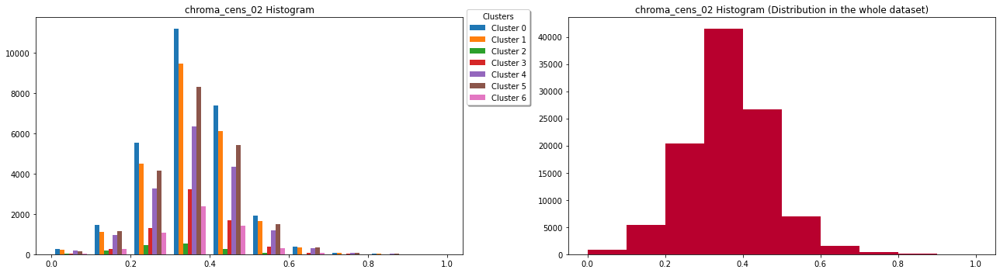

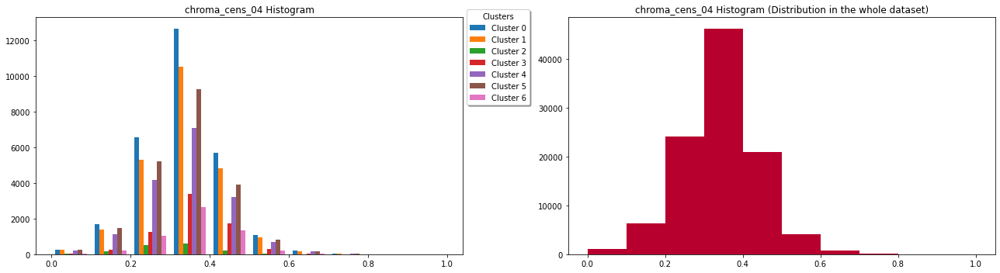

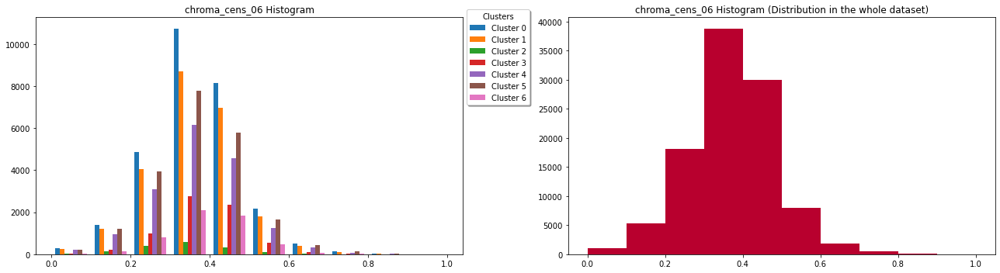

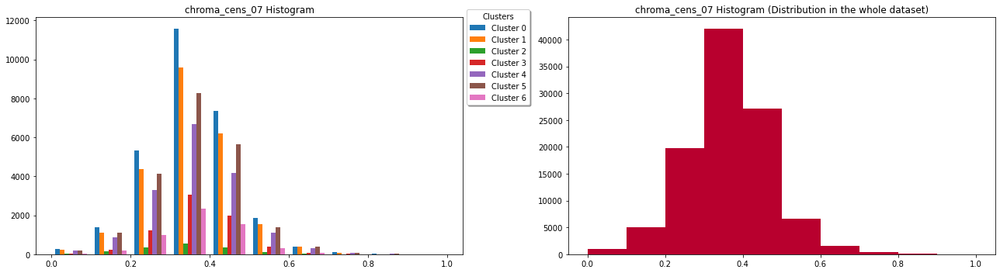

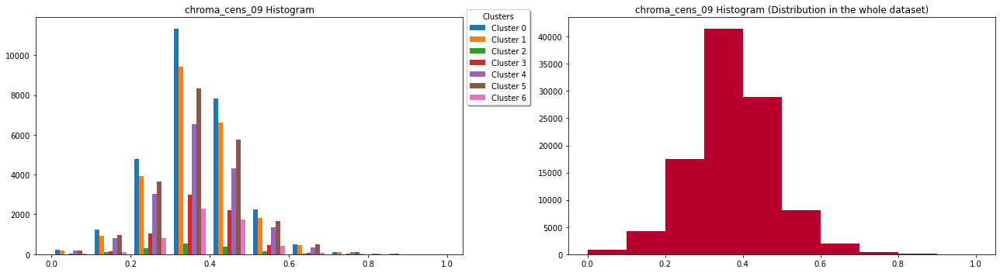

...

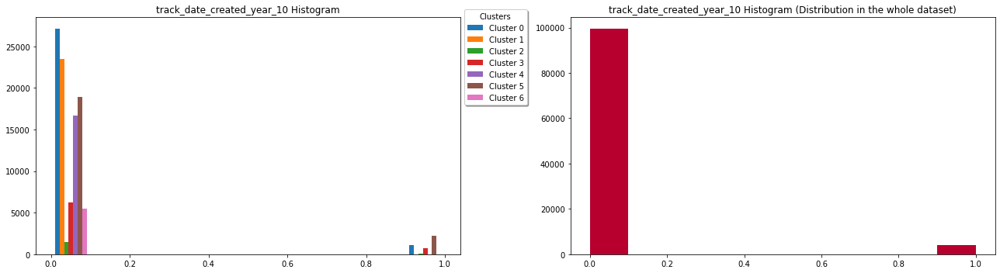

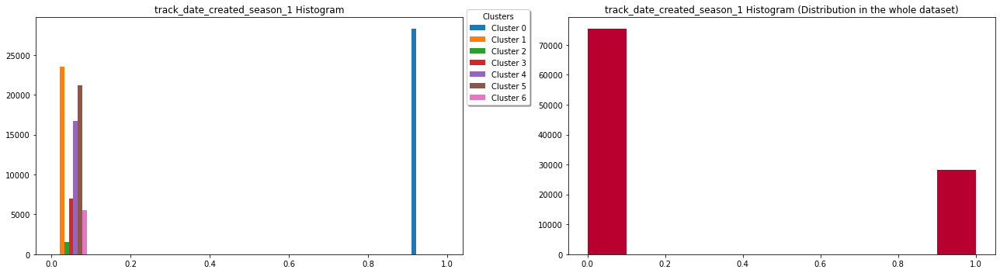

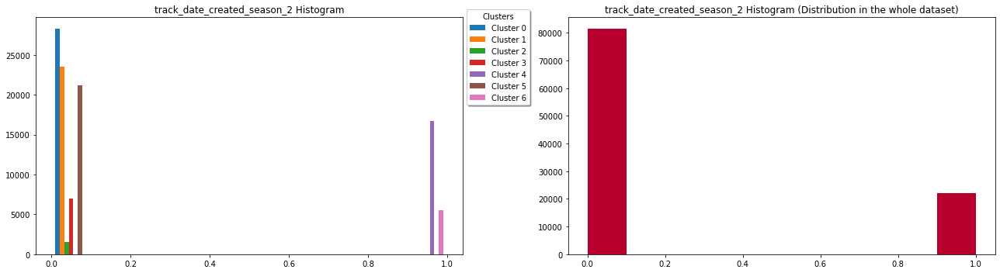

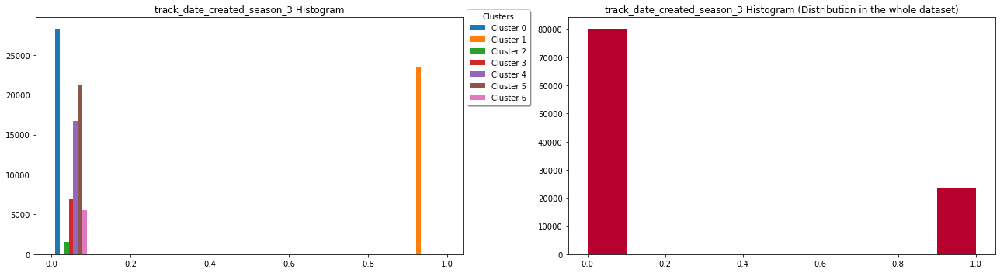

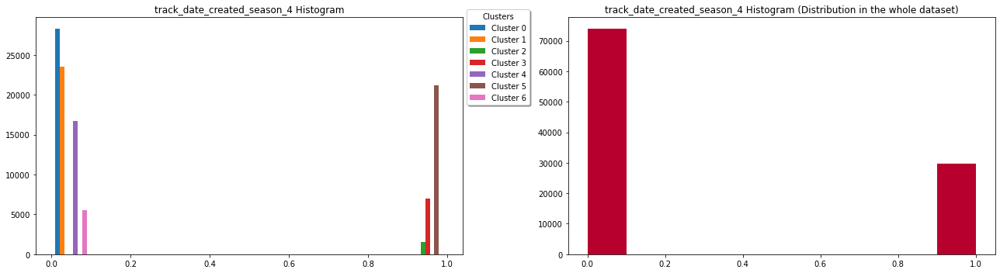

In [440]:
plot_general_distributions(df_original_onehot)

Cluster 0



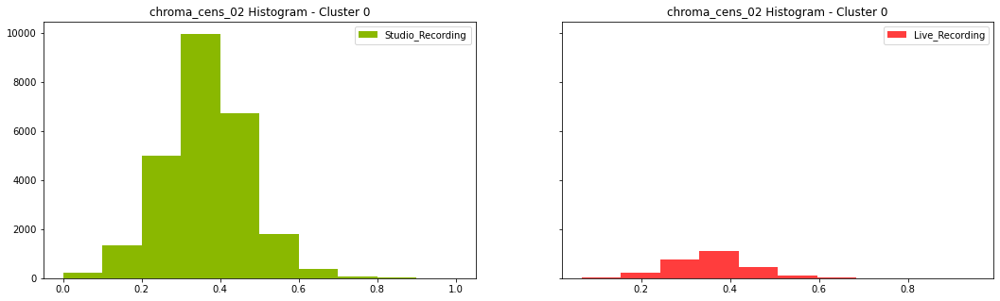

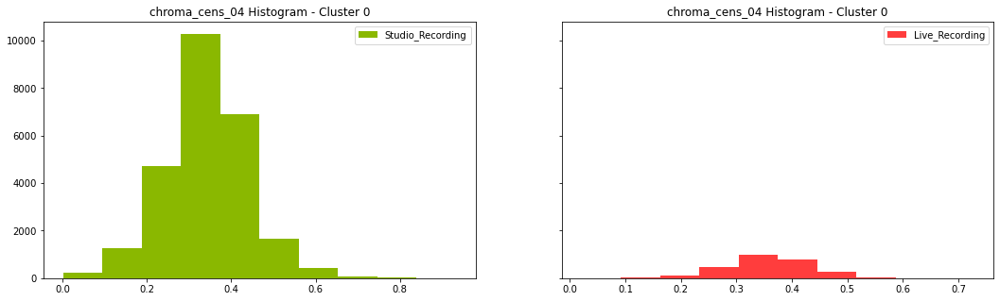

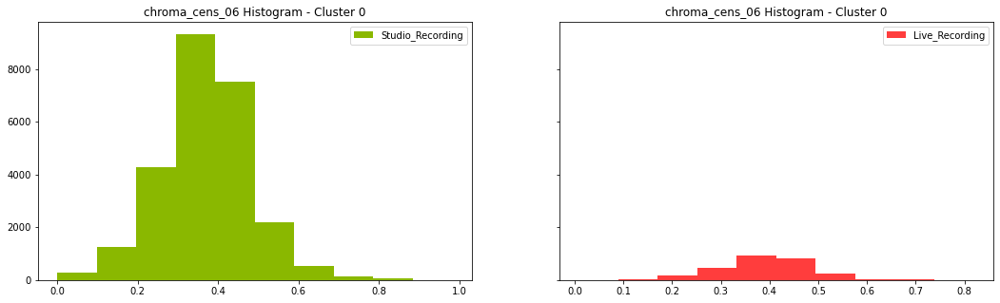

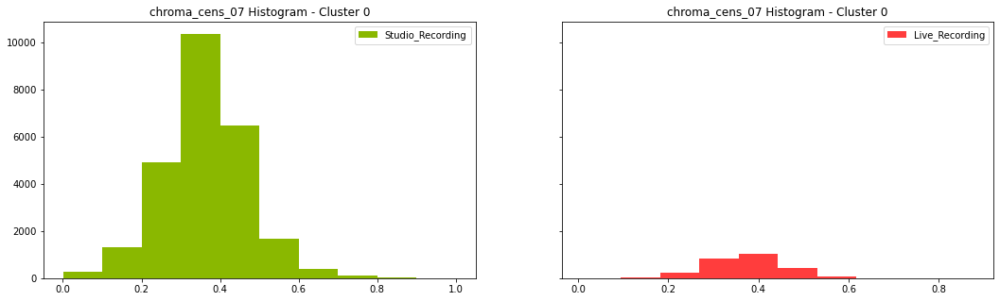

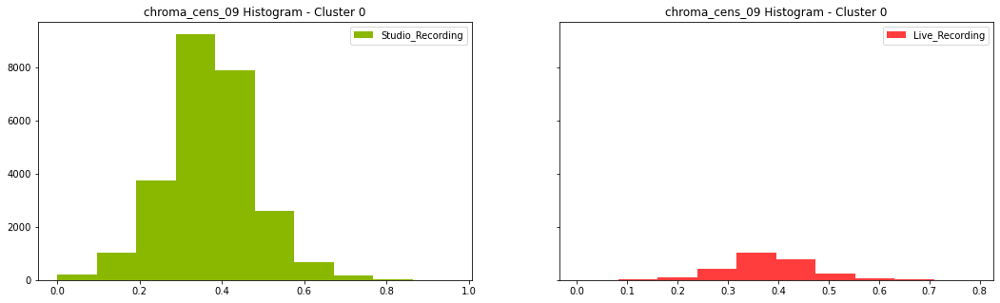

...

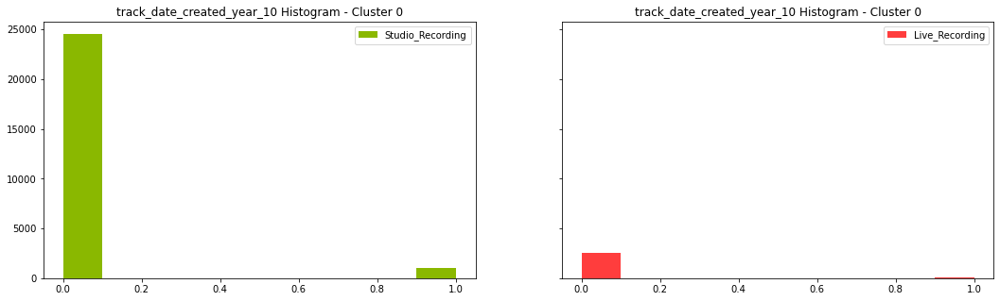

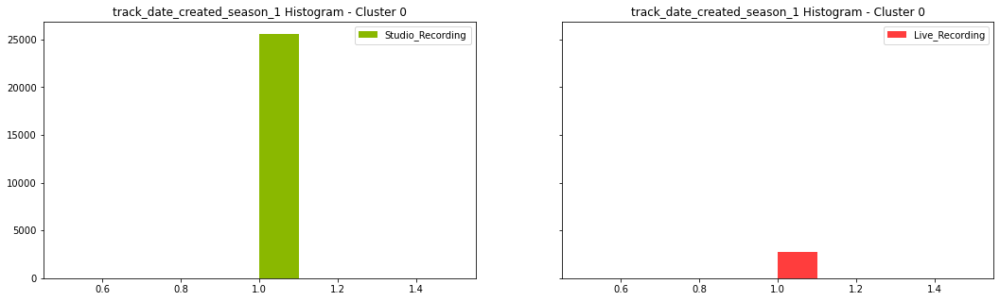

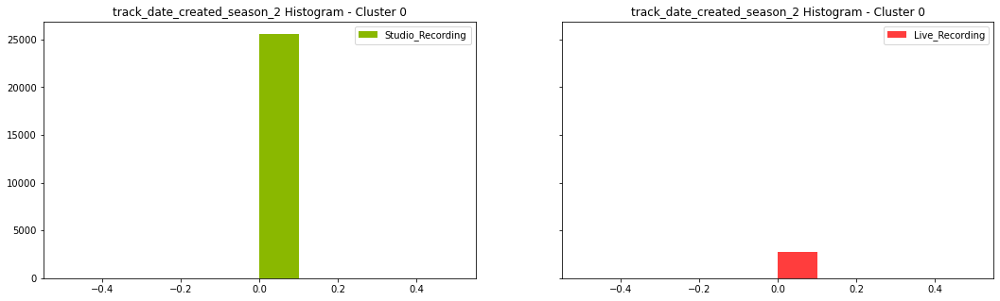

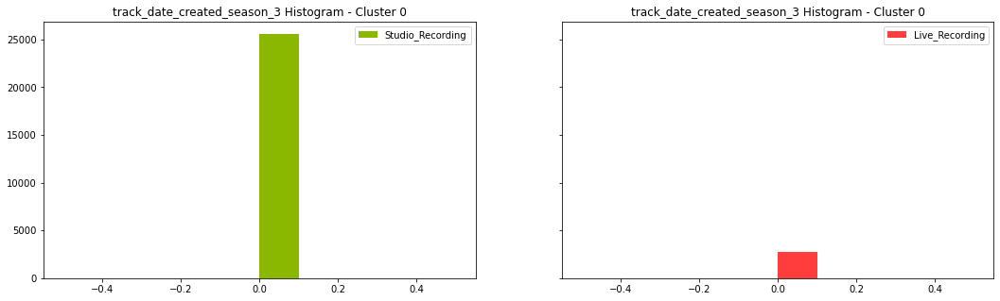

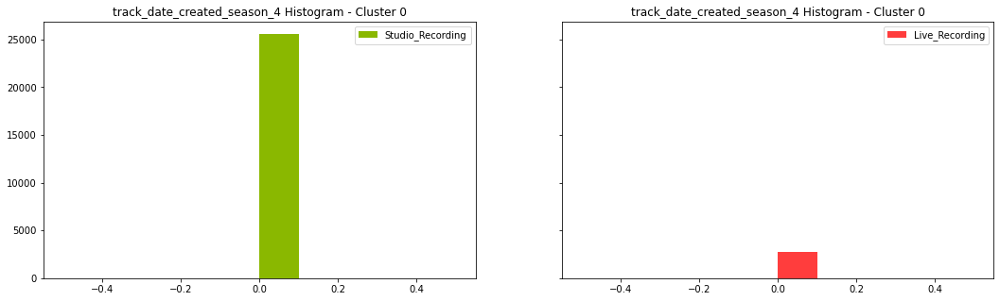

------------------------------------------------------------------------------------------------------------------
Cluster 1



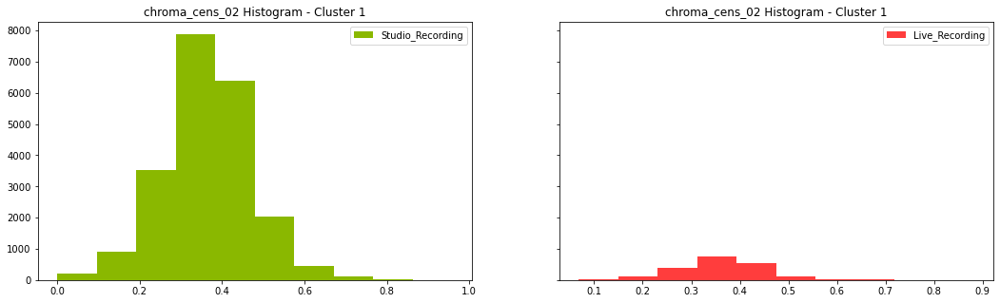

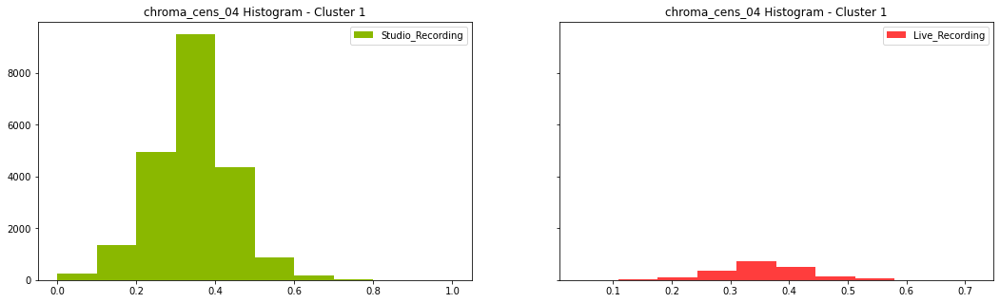

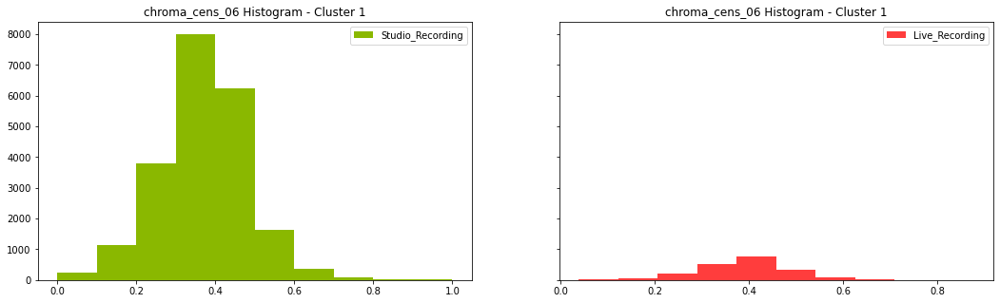

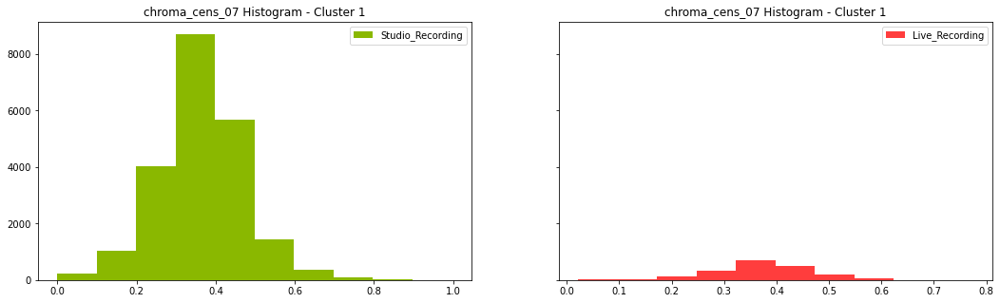

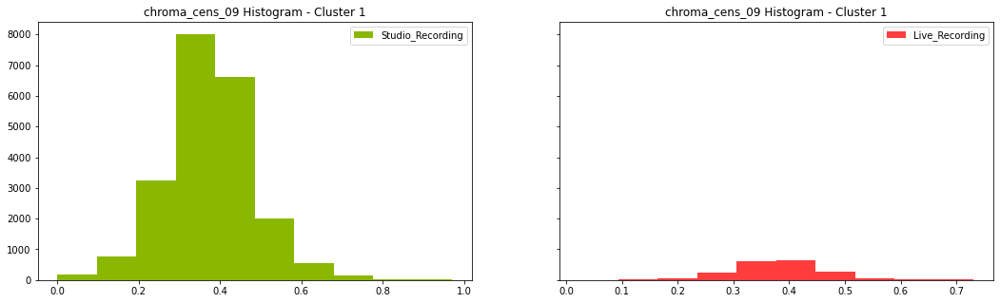

...

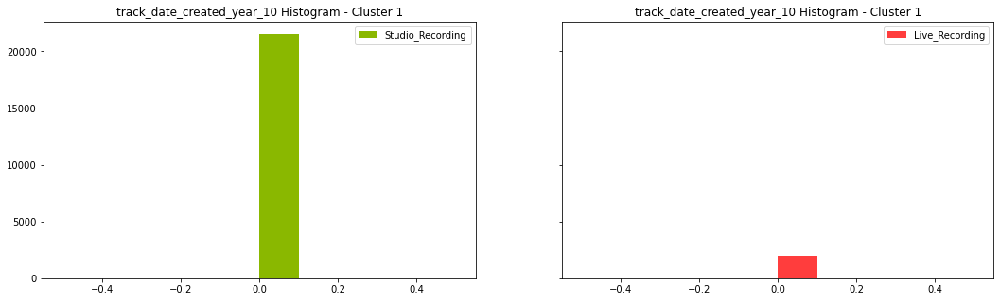

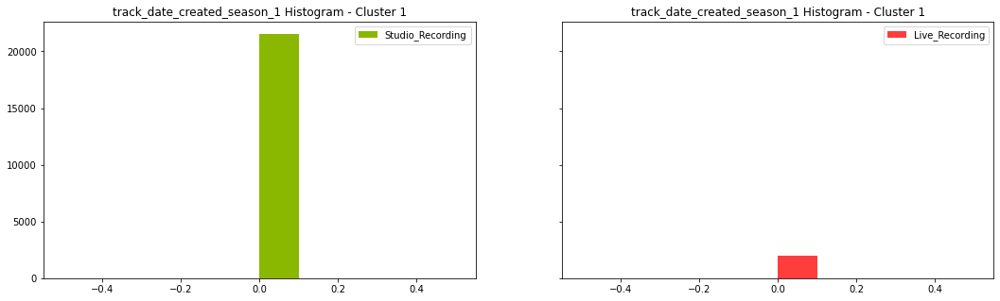

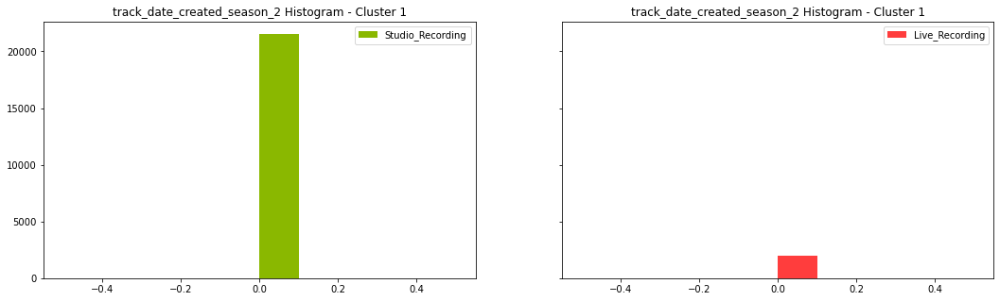

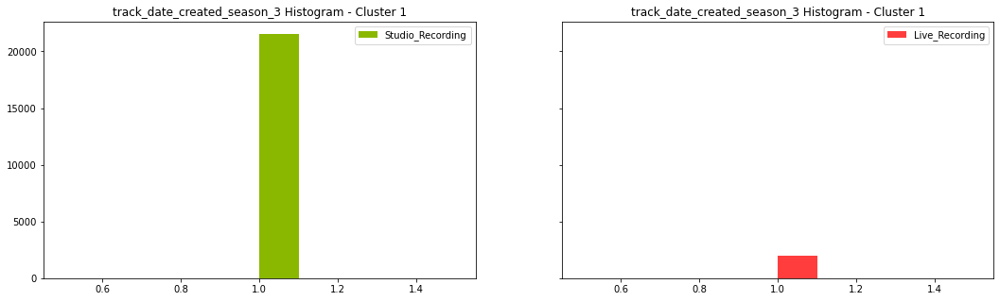

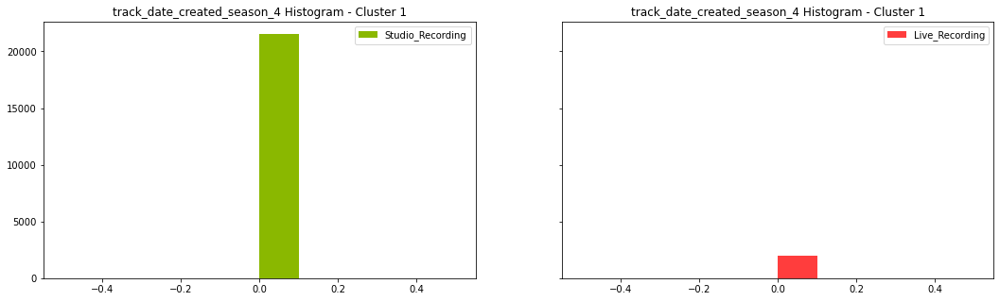

------------------------------------------------------------------------------------------------------------------
Cluster 2



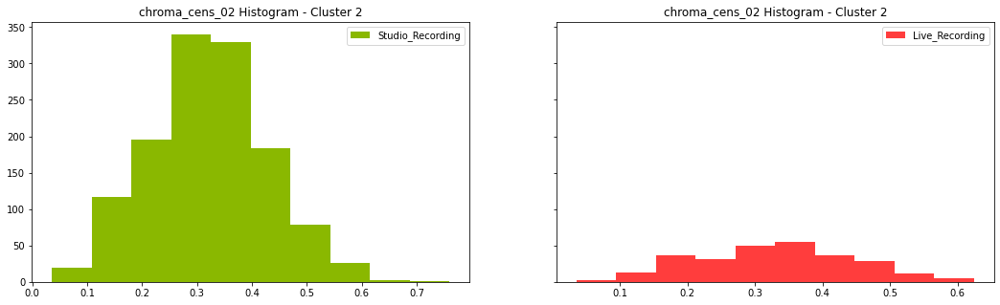

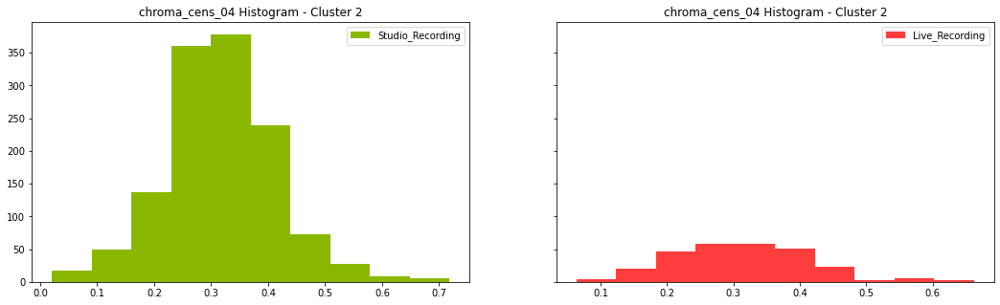

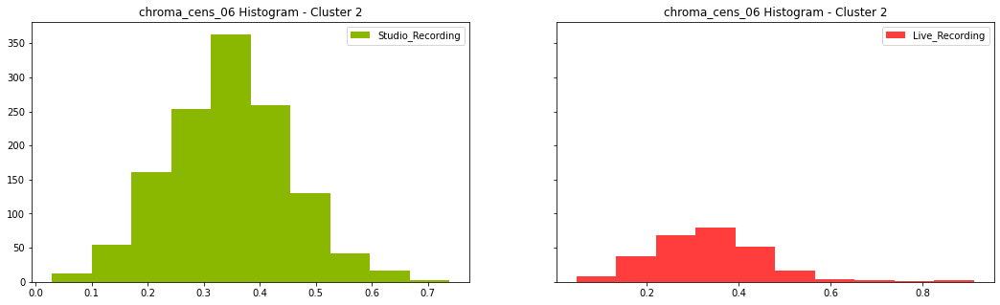

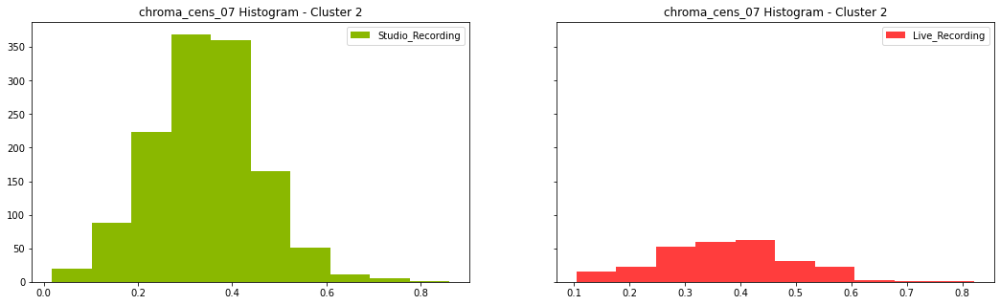

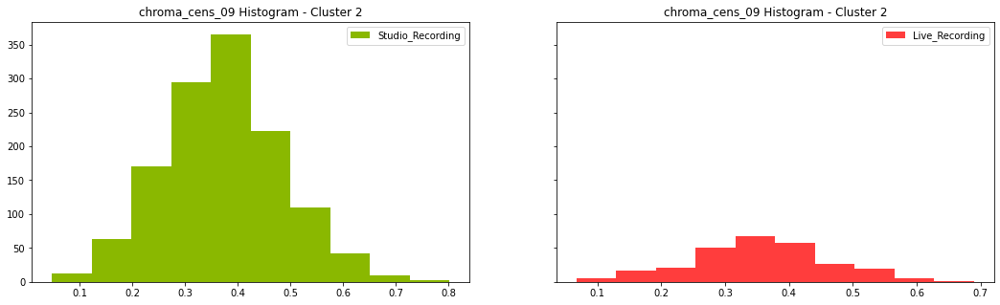

...

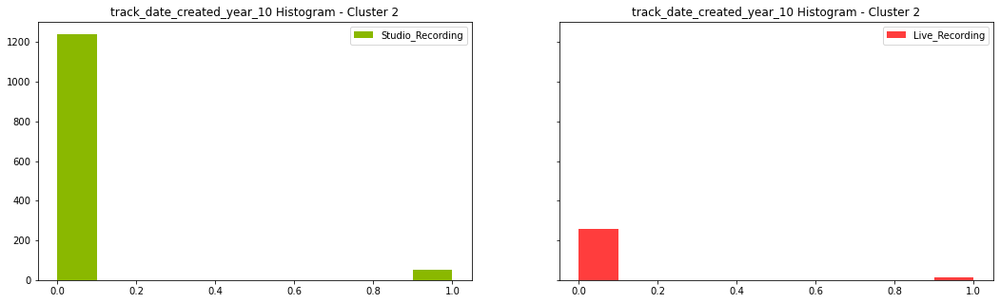

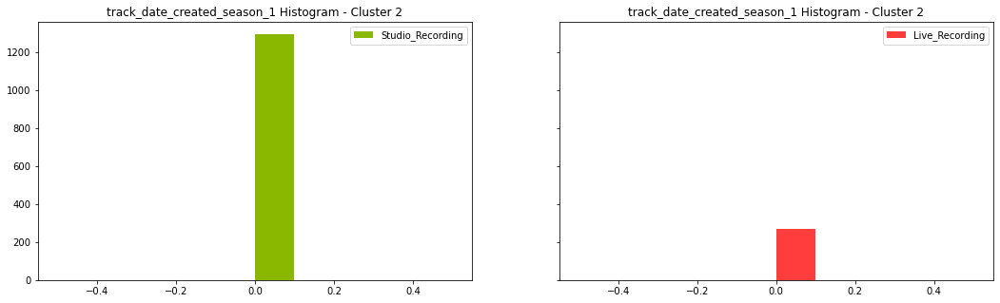

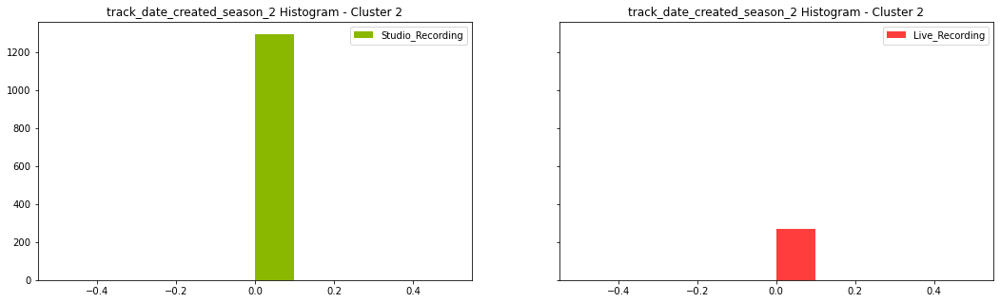

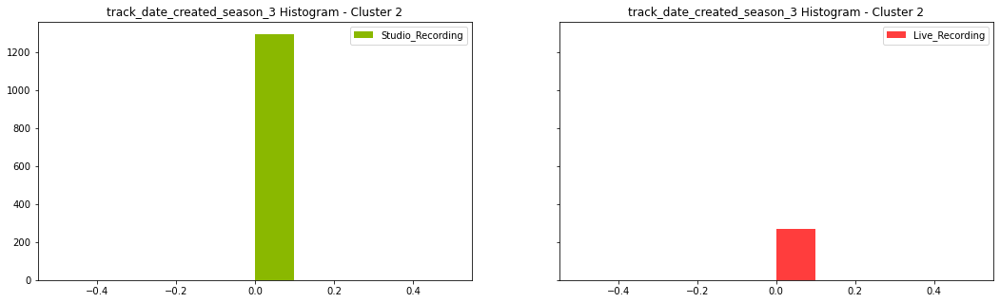

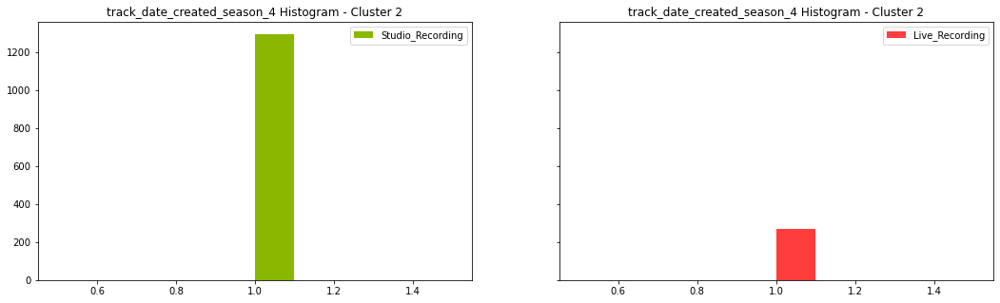

------------------------------------------------------------------------------------------------------------------
Cluster 3



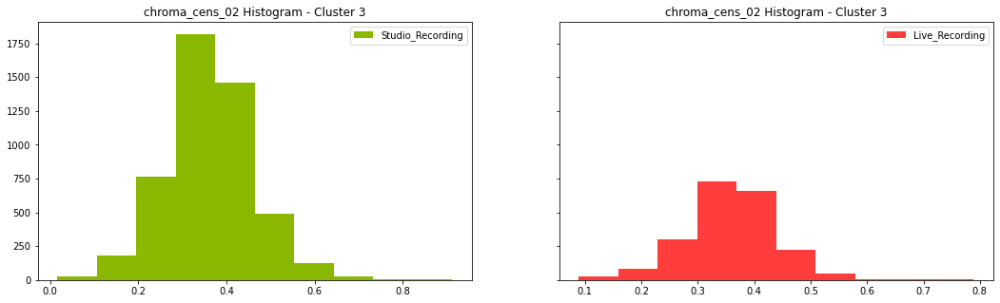

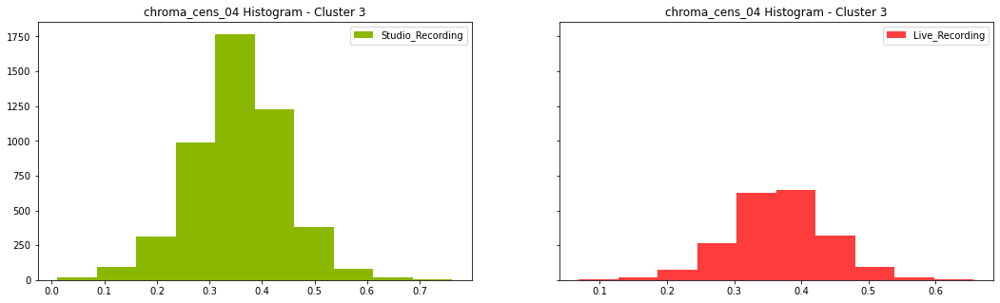

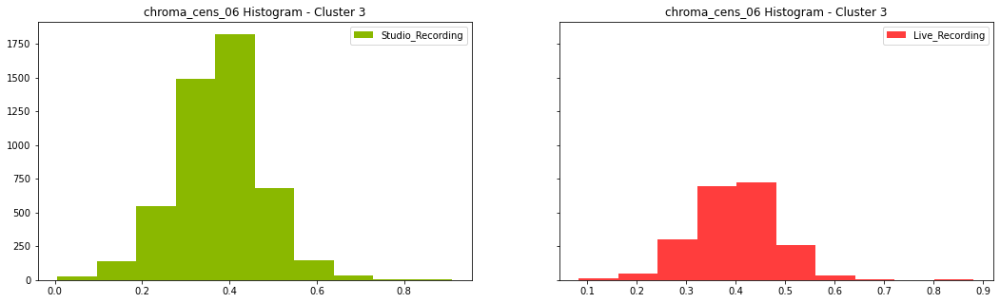

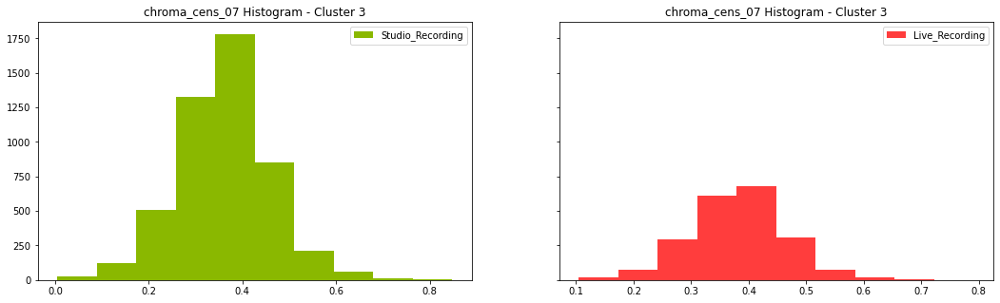

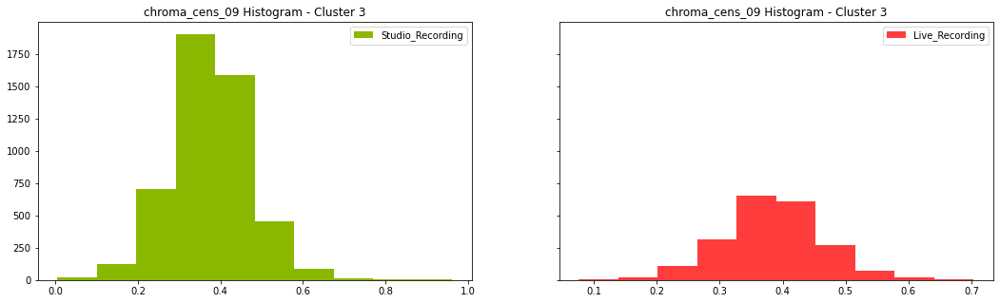

...

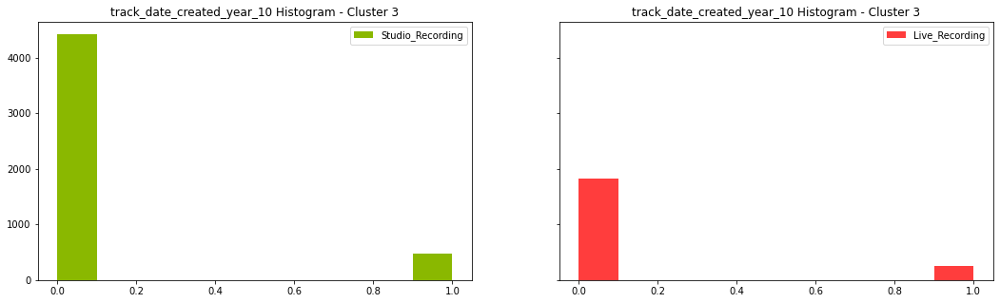

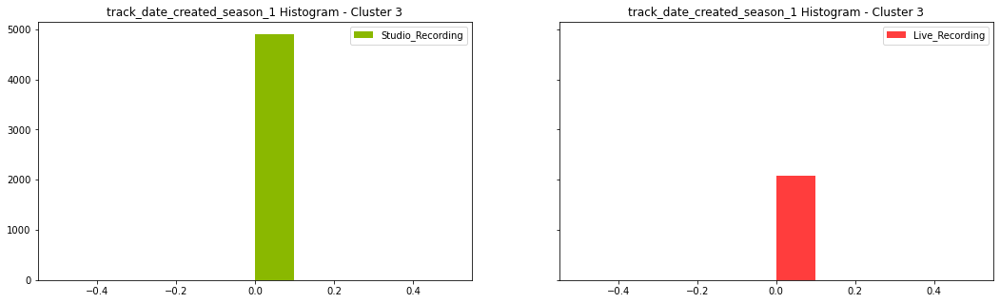

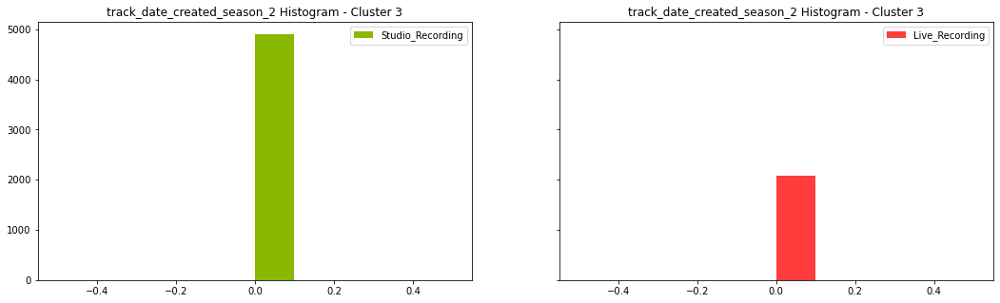

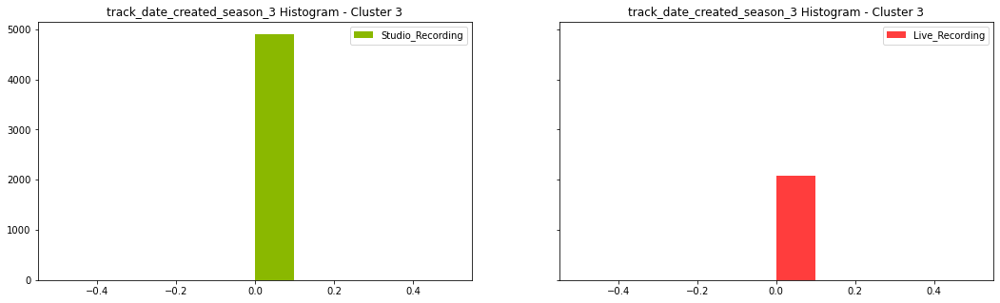

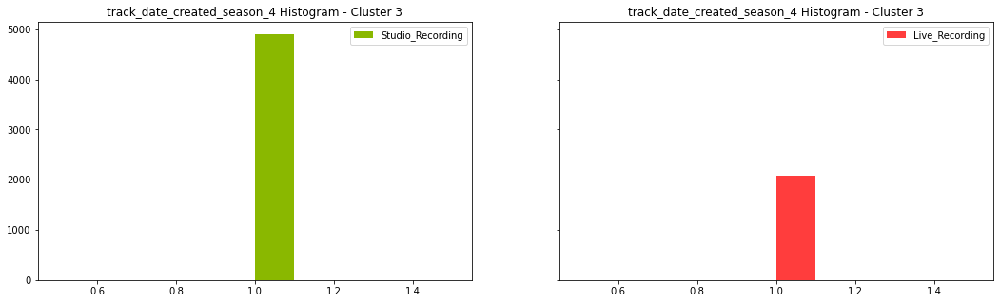

------------------------------------------------------------------------------------------------------------------
Cluster 4



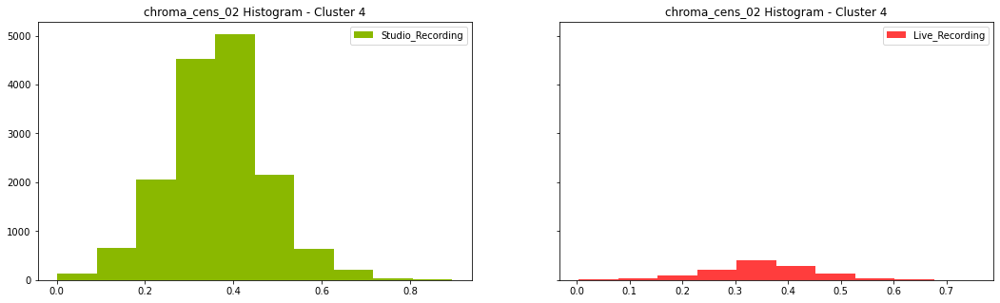

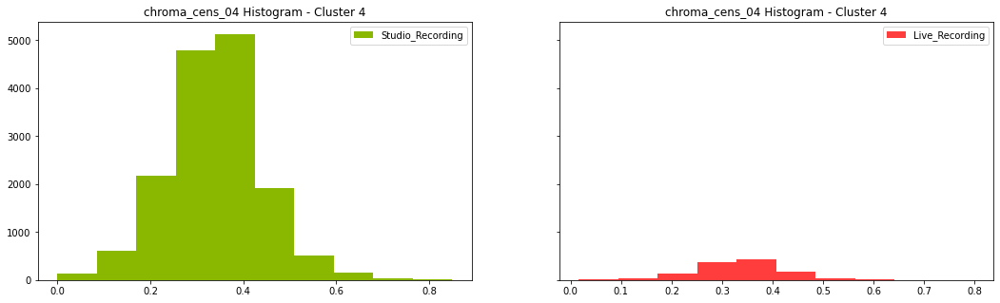

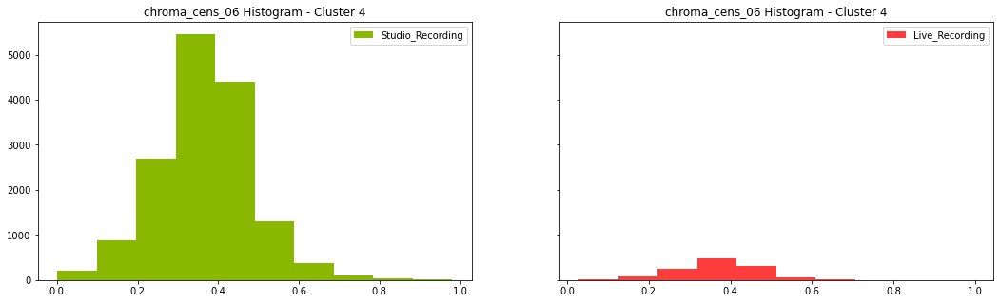

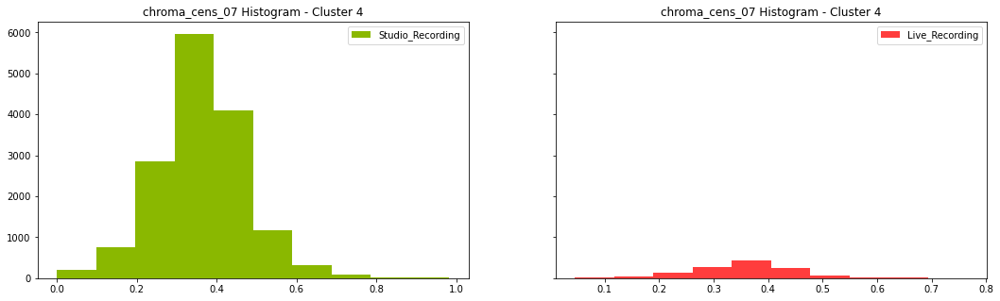

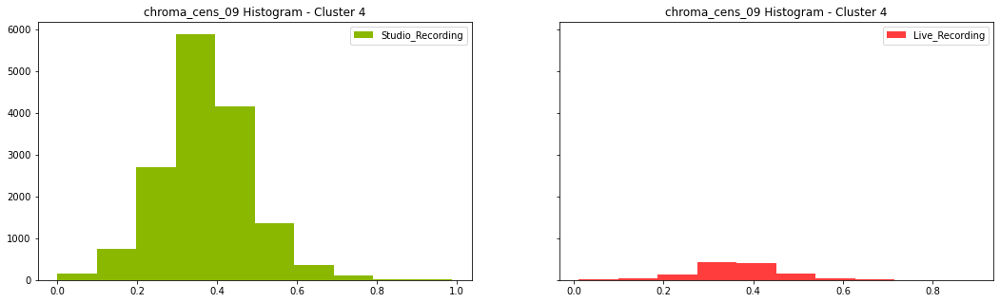

...

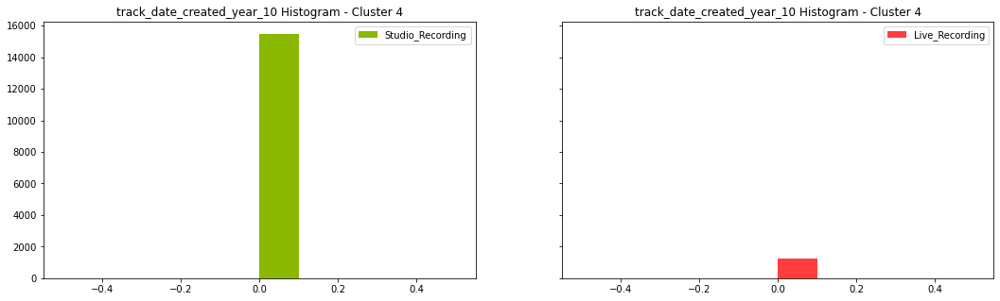

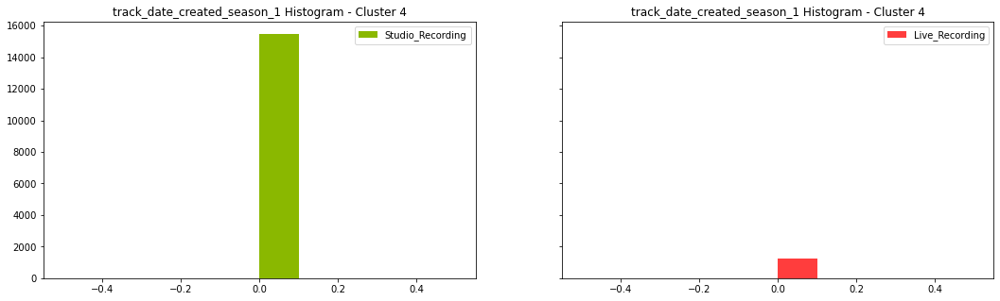

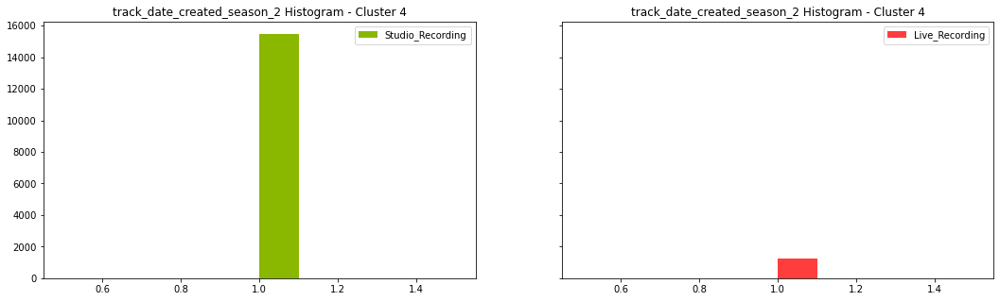

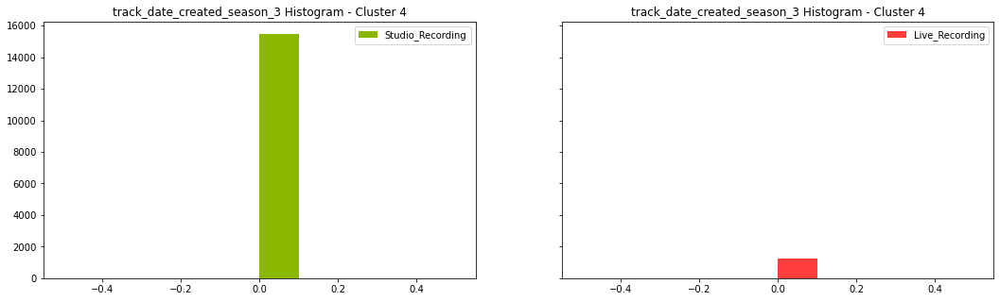

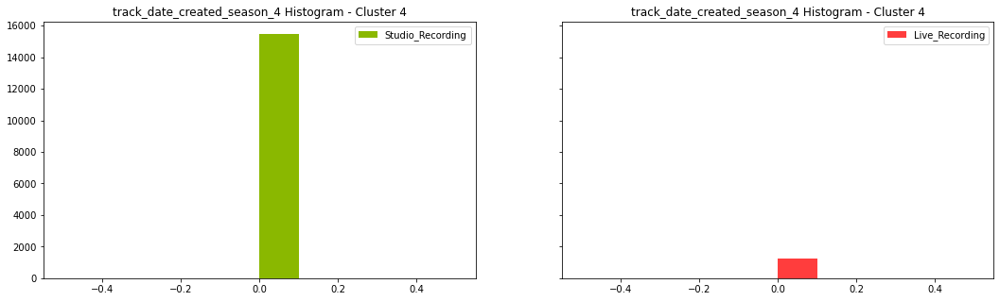

------------------------------------------------------------------------------------------------------------------
Cluster 5



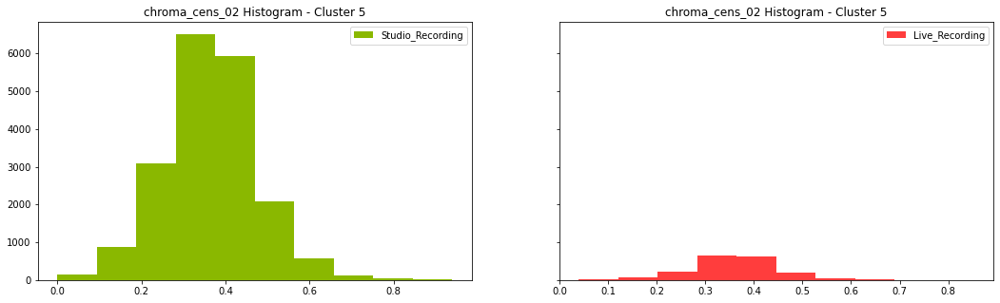

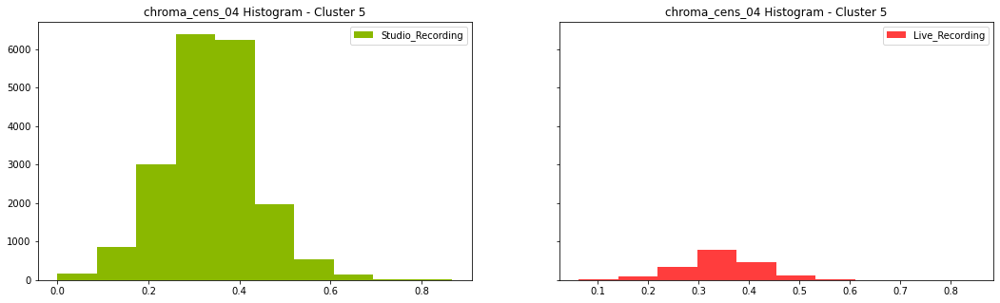

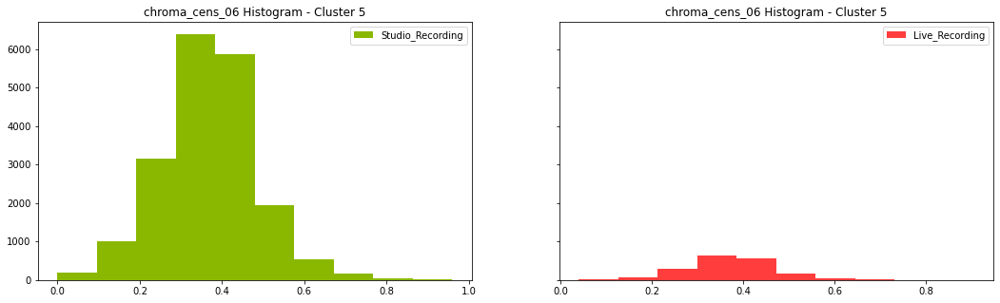

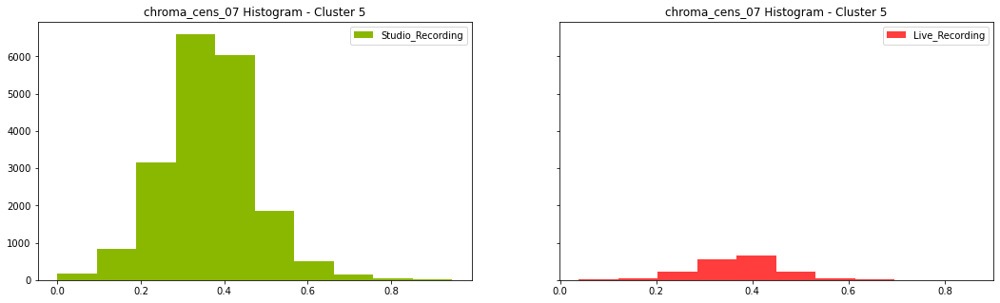

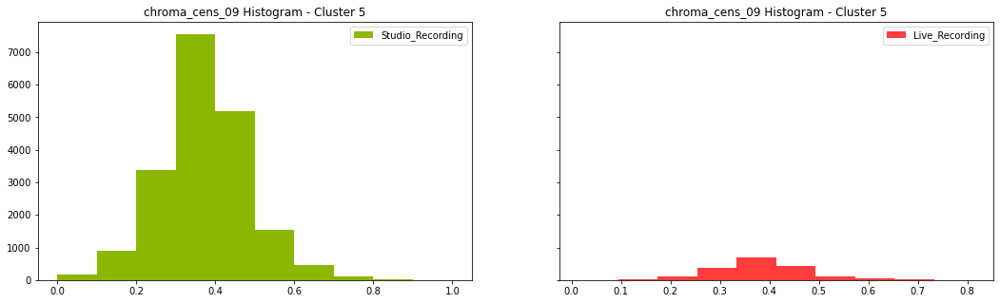

...

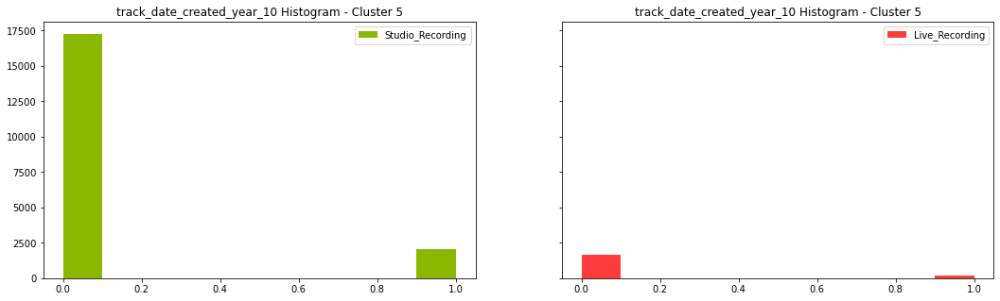

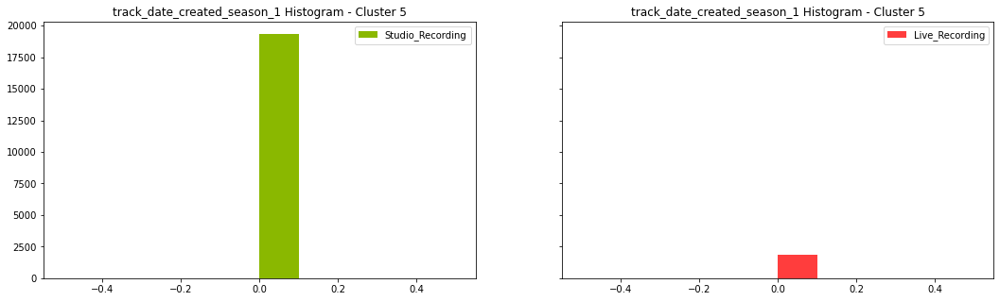

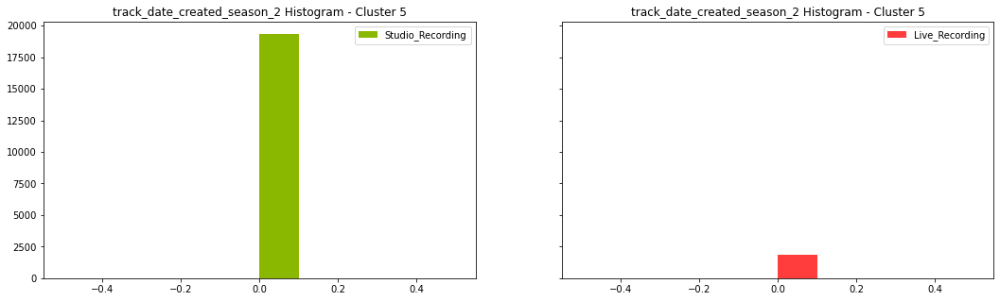

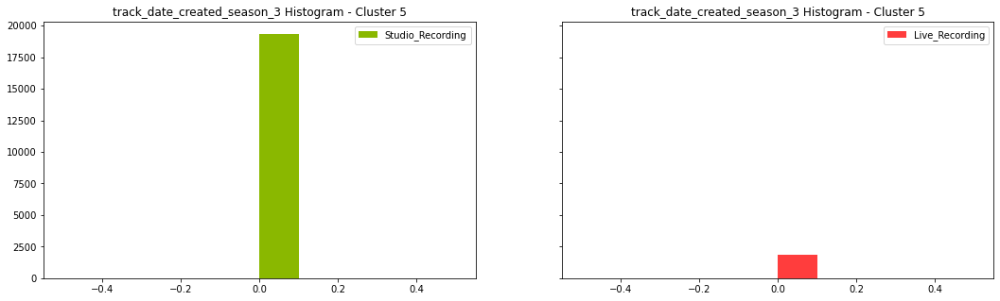

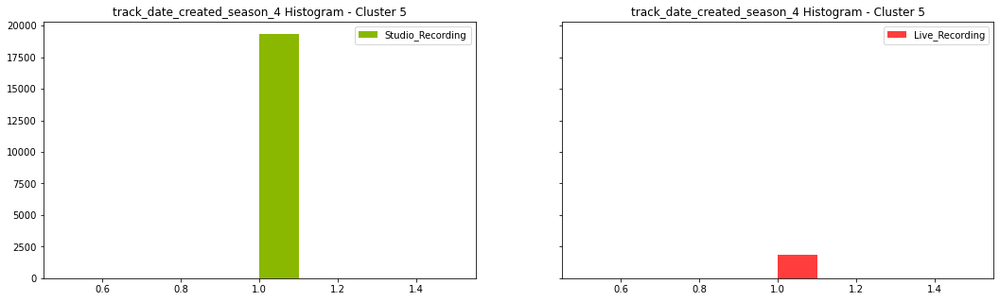

------------------------------------------------------------------------------------------------------------------
Cluster 6



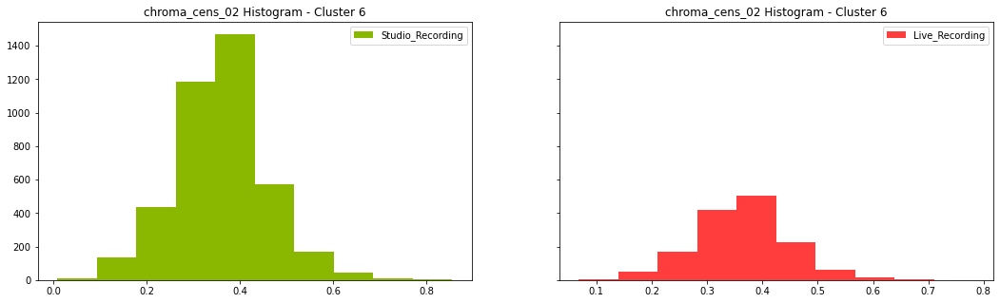

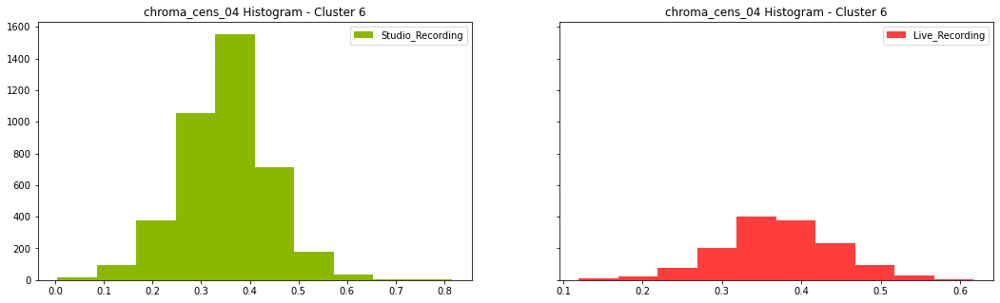

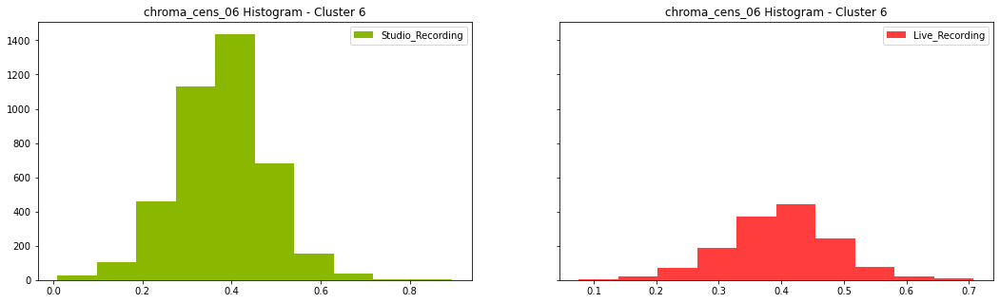

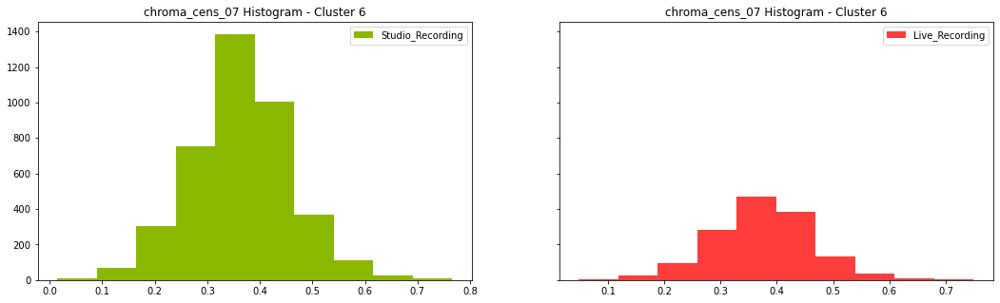

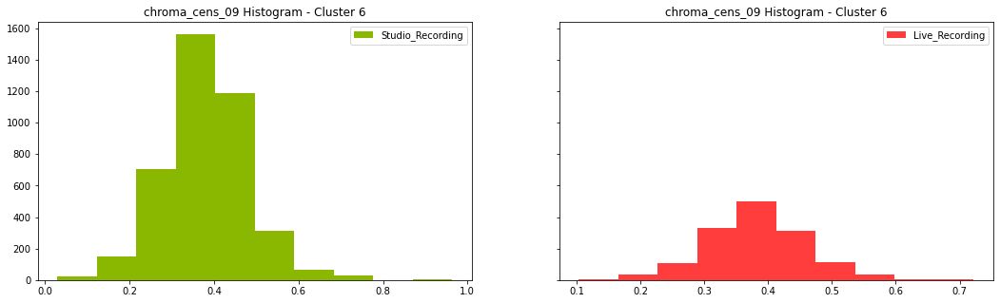

...

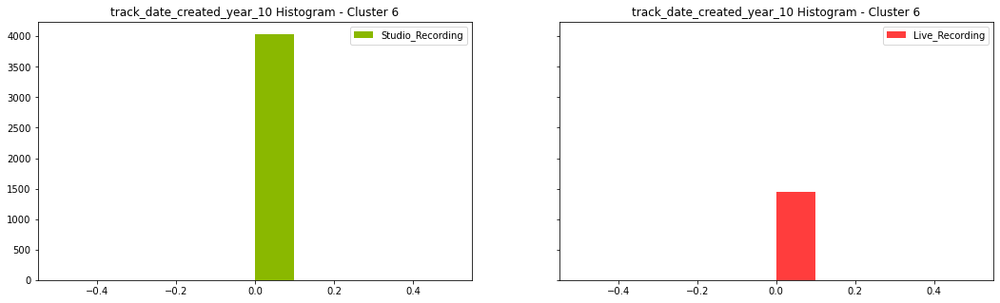

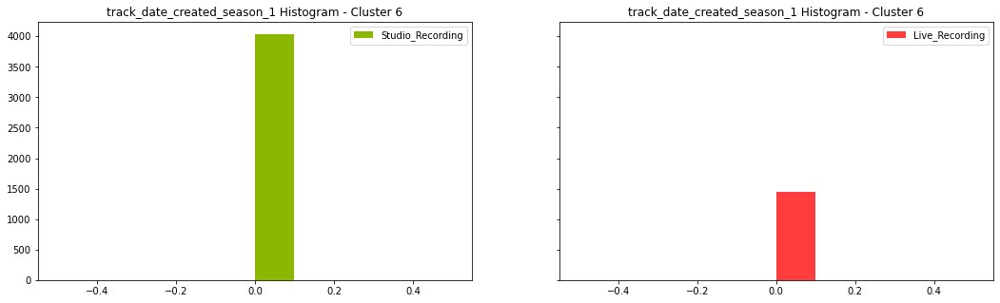

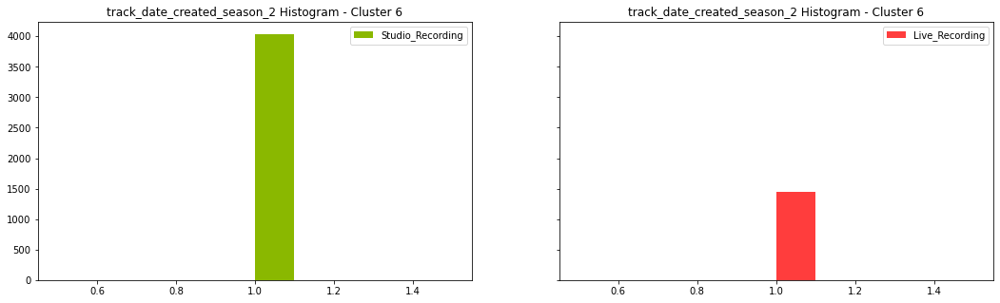

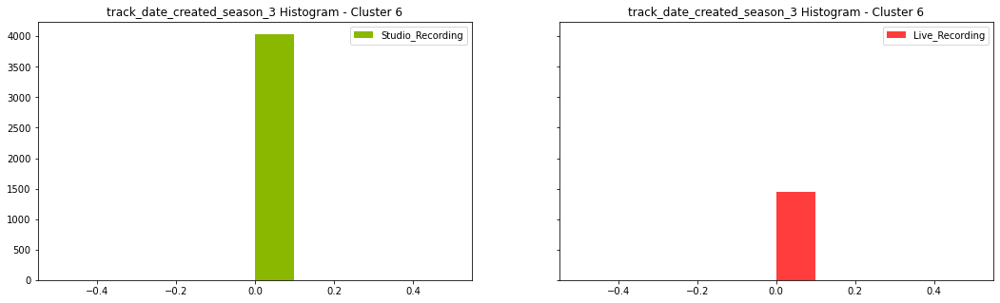

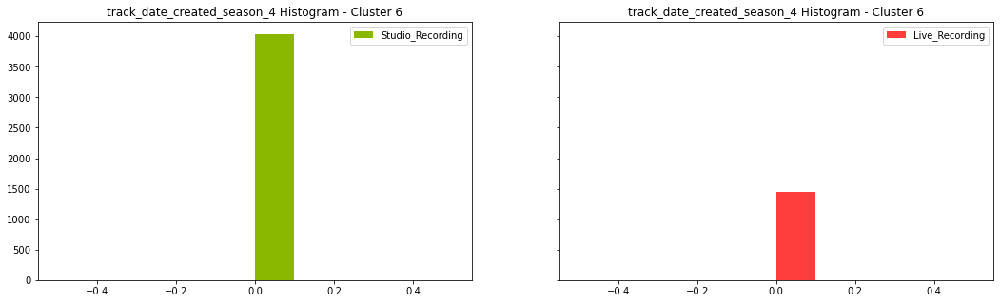

------------------------------------------------------------------------------------------------------------------


In [441]:
analyze_single_clusters(df_original_onehot)

In [449]:
df_generale.to_csv("kmodes_Huang.csv")